In [1]:
import inspect
import warnings

warnings.filterwarnings("ignore")

import umap
from pmlb import fetch_data  # , classification_dataset_names
from scipy.stats import entropy, mannwhitneyu
from seaborn import scatterplot
from sklearn.model_selection import train_test_split

from gower.gower_dist import *

pd.options.display.float_format = '{:.6f}'.format

plt.style.use("dark_background")

optimize = optimize_agglo

### This is a battery of tests to see how well various clustering evaluation metrics perform on a variety of datasets.

The datasets are all from the Penn Machine Learning Benchmark.

Each dataset is capped at 1,000 rows (stratified `train_test_split` with `random_state=42`).

The target variable is either binary or categorical.

### Dataset Selection:

All datasets were run through the `optimize_agglo` function with the default parameters.

If the maximum possible Gini-weighted average of Adjusted Mutual Information and Adjusted Rand Index across the grid of distance threshold values were greater than 0.4, the dataset was included in the analysis.

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

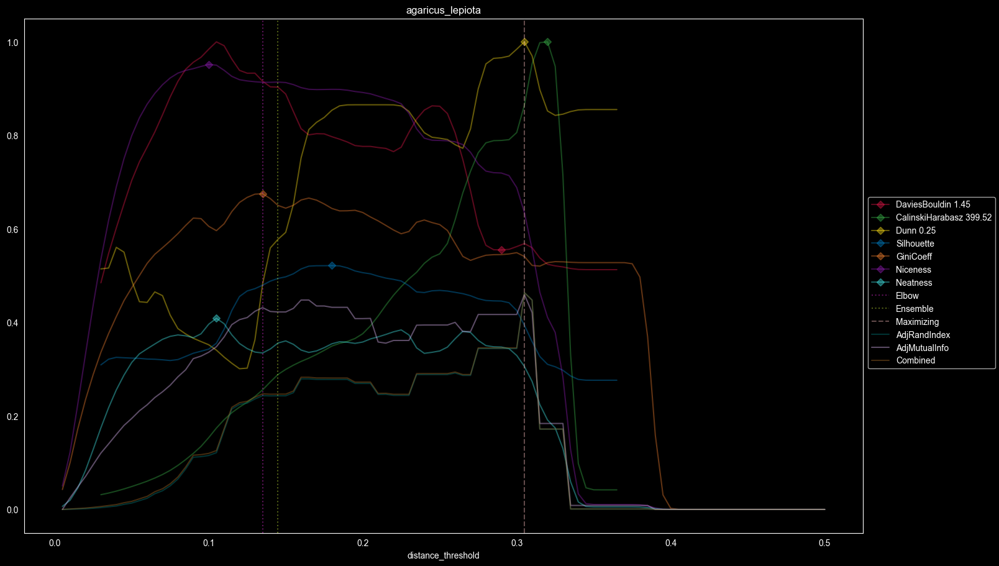

{'Silhouette': 0.3803645821846372, 'Niceness': 0.6198312769715347, 'GiniCoeff': 0.5775526526259664, 'Neatness': 0.27934729831084937, 'sample': {'distance_threshold': 0.305, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {5: 1, 19: 1, 172: 1, 225: 1, 579: 1}, 'DaviesBouldin': 0.8421203828264376, 'CalinskiHarabasz': 320.16872350469885, 'Dunn': 0.2614806750619887, 'AdjRandIndex': 0.463652015896542, 'AdjMutualInfo': 0.45961611413335485, 'Combined': 0.4635702434268}
0    519
1    481
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.416945      0.344005  0.345483
CalinskiHarabasz       0.183851      0.171761  0.172006
Dunn                   0.459616      0.463652  0.463570
Silhouette             0.432269      0.277956  0.281082
GiniCoeff              0.431592      0.243301  0.247116
Niceness               0.336193      0.115395  0.119868
Neatness               0.348069

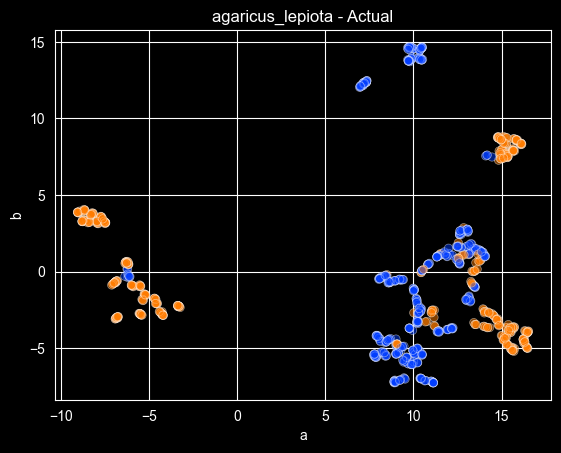

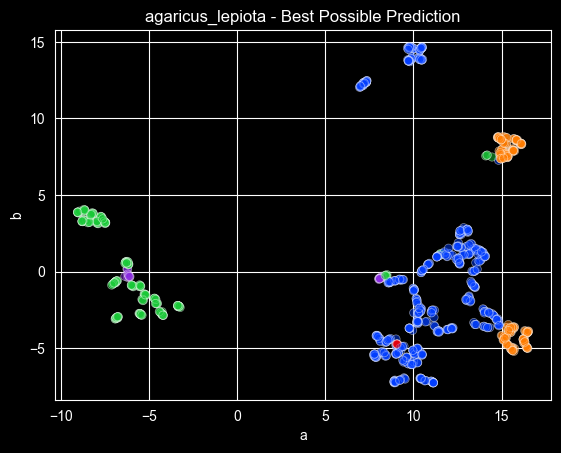

Dataset Summary
n   1000.000000
d     22.000000
k      2.000000
e      0.692425
g      0.020261
Name: agaricus_lepiota, dtype: float64


  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/841 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

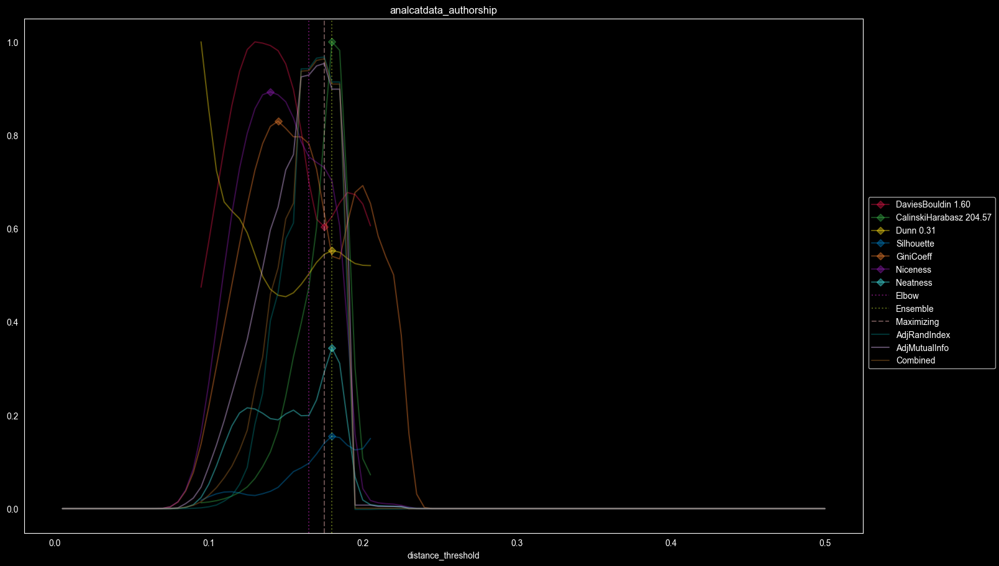

{'Silhouette': 0.141266431462078, 'Niceness': 0.7405702259780766, 'GiniCoeff': 0.665656887755102, 'Neatness': 0.27424024985517165, 'sample': {'distance_threshold': 0.175, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 3: 2, 4: 1, 55: 1, 174: 1, 287: 1, 314: 1}, 'DaviesBouldin': 0.9469917717593519, 'CalinskiHarabasz': 150.17339185108494, 'Dunn': 0.167304834196218, 'AdjRandIndex': 0.9676308175806052, 'AdjMutualInfo': 0.9537722960884977, 'Combined': 0.9636137907833073}
0    317
1    296
3    173
2     55
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.953772      0.967631  0.963614
CalinskiHarabasz       0.898647      0.914010  0.909557
Dunn                   0.898647      0.914010  0.909557
Silhouette             0.898647      0.914010  0.909557
GiniCoeff              0.645835      0.462356  0.515539
Niceness               0.597190      0.402334  0.458815
N

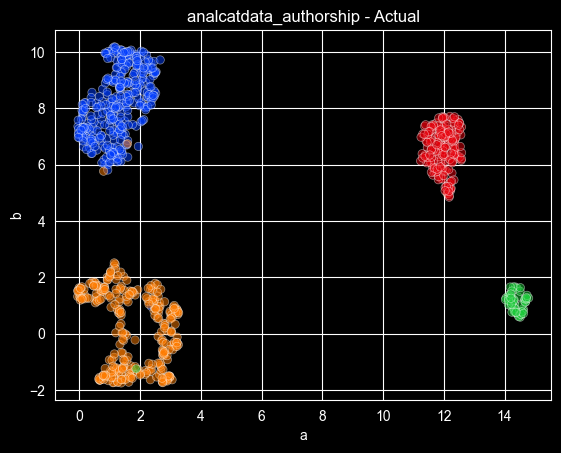

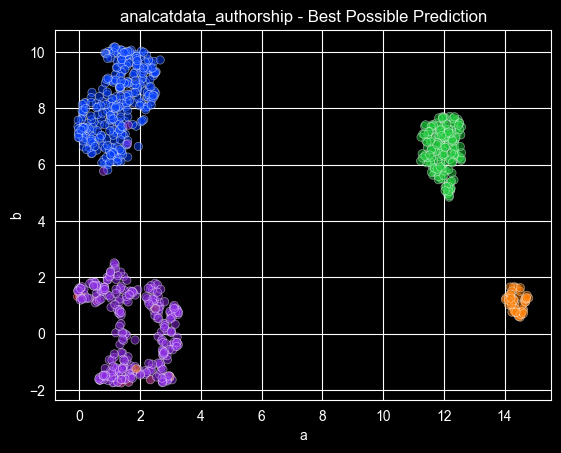

Dataset Summary
n   841.000000
d    70.000000
k     4.000000
e     1.238942
g     0.289860
Name: analcatdata_authorship, dtype: float64


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/699 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

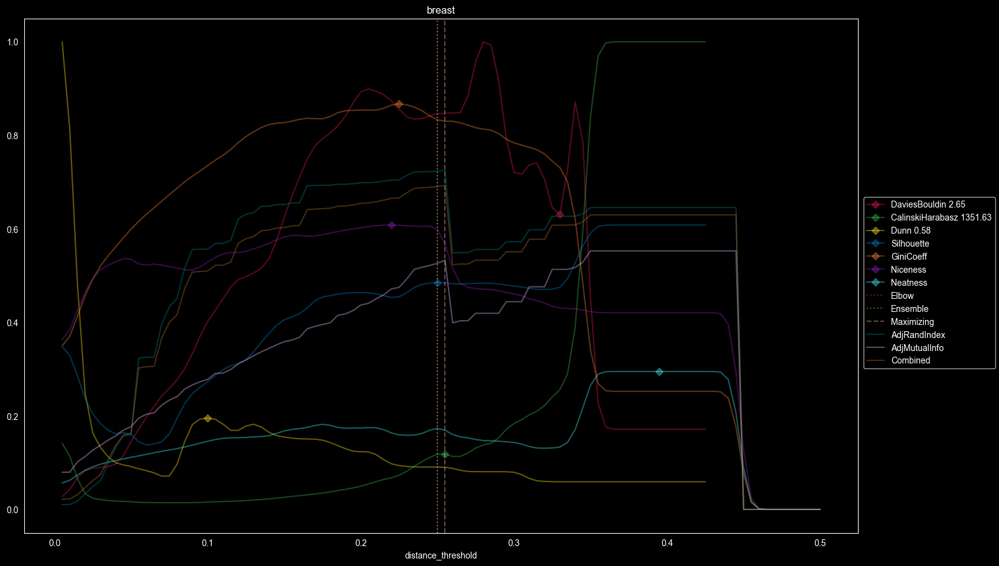

{'Silhouette': 0.4858914858407512, 'Niceness': 0.606714140595063, 'GiniCoeff': 0.8252005943536405, 'Neatness': 0.17809807647149623, 'sample': {'distance_threshold': 0.255, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 2: 1, 3: 1, 4: 3, 7: 1, 10: 1, 14: 1, 19: 1, 27: 1, 28: 1, 63: 1, 69: 1, 444: 1}, 'DaviesBouldin': 2.2061256664256708, 'CalinskiHarabasz': 172.7705985340477, 'Dunn': 0.052293381857846204, 'AdjRandIndex': 0.7254323575747712, 'AdjMutualInfo': 0.5330655880233846, 'Combined': 0.6931787672684139}
0    458
1    241
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.513378      0.626980  0.607932
CalinskiHarabasz       0.533066      0.725432  0.693179
Dunn                   0.278274      0.556501  0.509851
Silhouette             0.526313      0.723231  0.690214
GiniCoeff              0.474854      0.704620  0.666096
Niceness               0.471694   

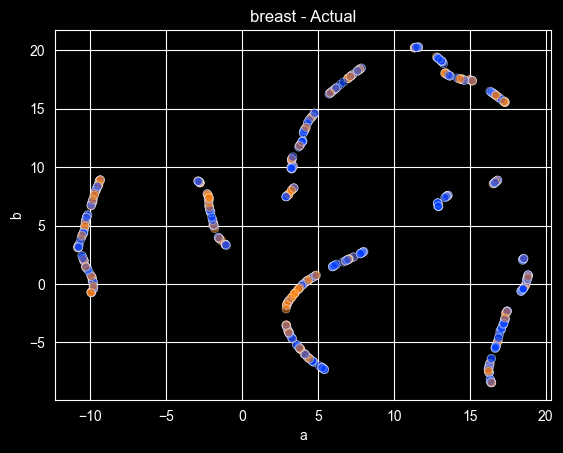

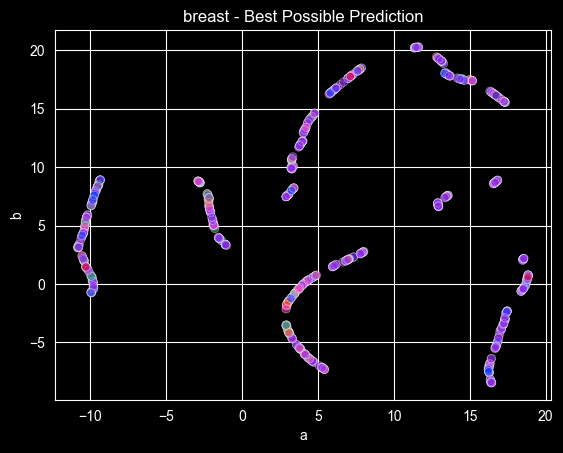

Dataset Summary
n   699.000000
d    10.000000
k     2.000000
e     0.644154
g     0.167667
Name: breast, dtype: float64


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/569 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

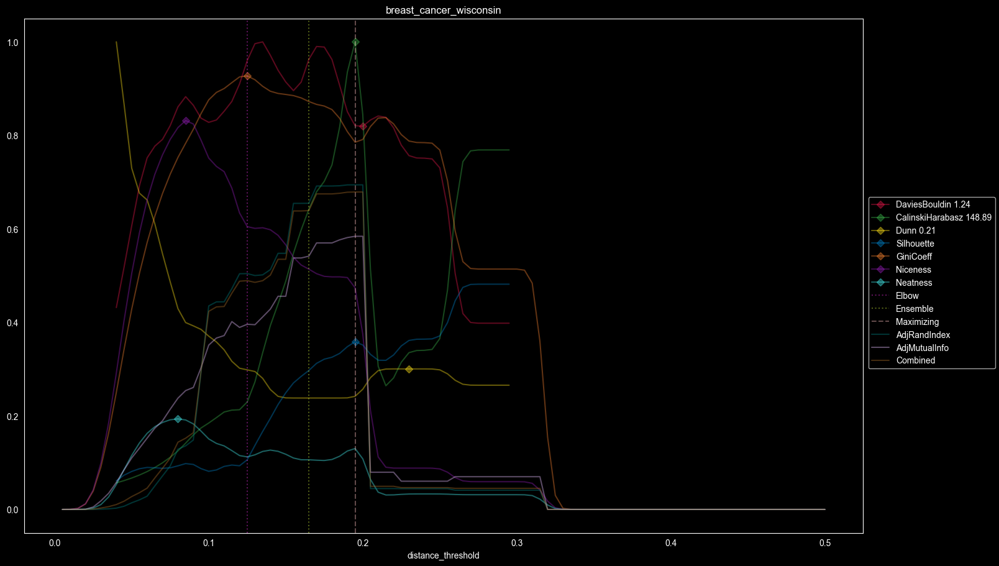

{'Silhouette': 0.3689079924186501, 'Niceness': 0.49835139389421224, 'GiniCoeff': 0.7655364978061427, 'Neatness': 0.14349770323387787, 'sample': {'distance_threshold': 0.195, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 4: 2, 15: 1, 160: 1, 385: 1}, 'DaviesBouldin': 0.9969940672958436, 'CalinskiHarabasz': 165.82529095915888, 'Dunn': 0.05047071517981541, 'AdjRandIndex': 0.6941464166407882, 'AdjMutualInfo': 0.5841595262643937, 'Combined': 0.6788789902941647}
0    357
1    212
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.584160      0.694146  0.678879
CalinskiHarabasz       0.584160      0.694146  0.678879
Dunn                   0.060389      0.044405  0.046624
Silhouette             0.584160      0.694146  0.678879
GiniCoeff              0.396037      0.504338  0.489304
Niceness               0.254164      0.135955  0.152364
Neatness               0.237

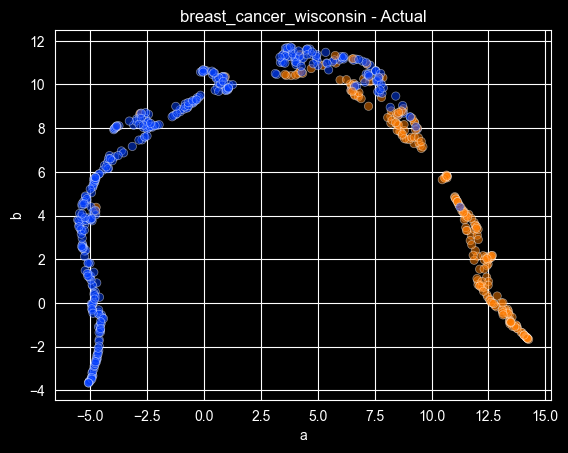

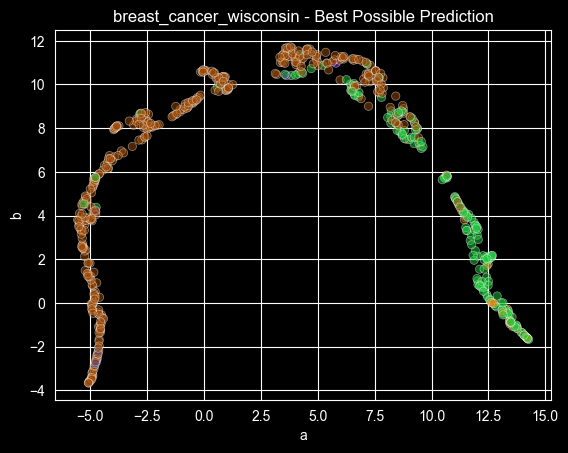

Dataset Summary
n   569.000000
d    30.000000
k     2.000000
e     0.660316
g     0.138811
Name: breast_cancer_wisconsin, dtype: float64


  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

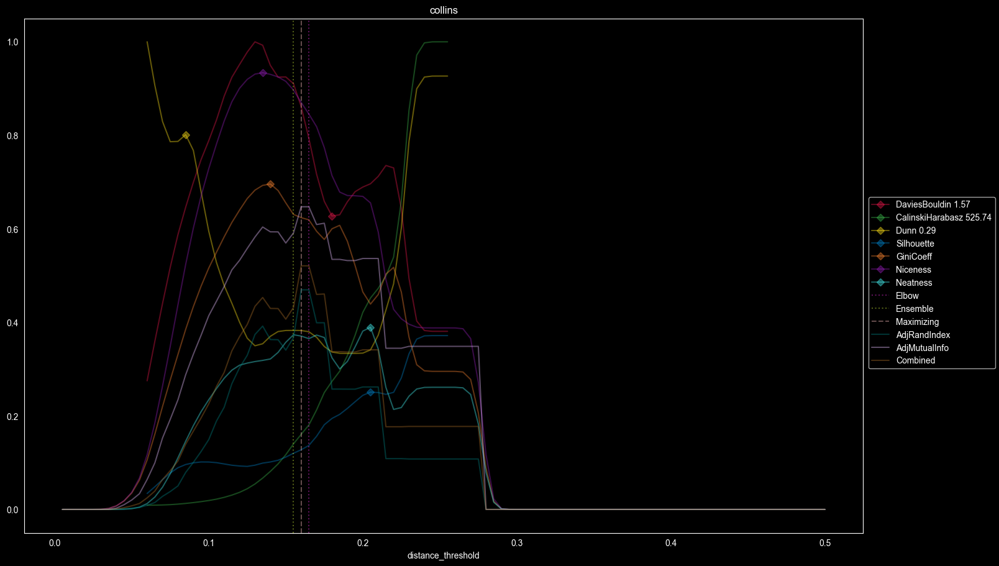

{'Silhouette': 0.1297931609339418, 'Niceness': 0.8551379381712955, 'GiniCoeff': 0.6294353594569577, 'Neatness': 0.3615494418716325, 'sample': {'distance_threshold': 0.16, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 2: 3, 5: 1, 45: 1, 104: 1, 105: 1, 107: 1, 111: 1}, 'DaviesBouldin': 1.3069715245143998, 'CalinskiHarabasz': 88.08809769720627, 'Dunn': 0.10919832347575743, 'AdjRandIndex': 0.46959911743271227, 'AdjMutualInfo': 0.6472800005507138, 'Combined': 0.5209358040478707}
8     80
6     75
5     48
0     44
4     36
7     30
9     29
12    29
13    29
1     27
10    24
2     17
3     17
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.534777      0.257342  0.337500
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.287973      0.079047  0.139411
Silhouette             0.536659      0.261915  0.341296
GiniCoeff             

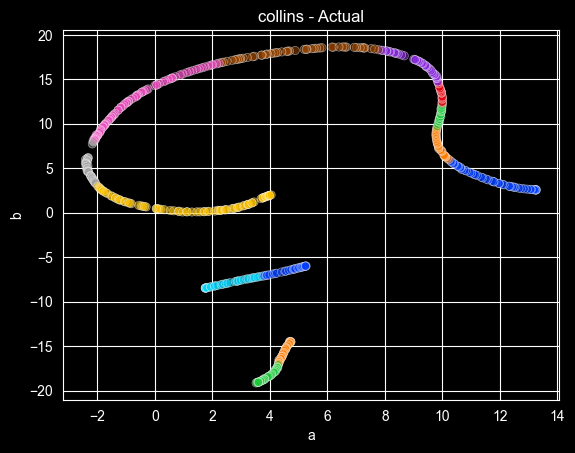

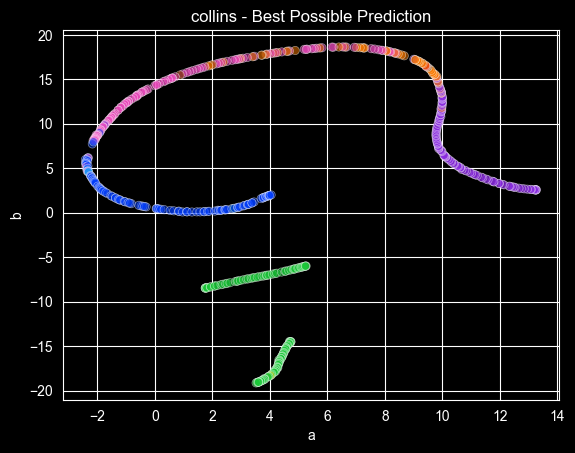

Dataset Summary
n   485.000000
d    23.000000
k    13.000000
e     2.447482
g     0.288926
Name: collins, dtype: float64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

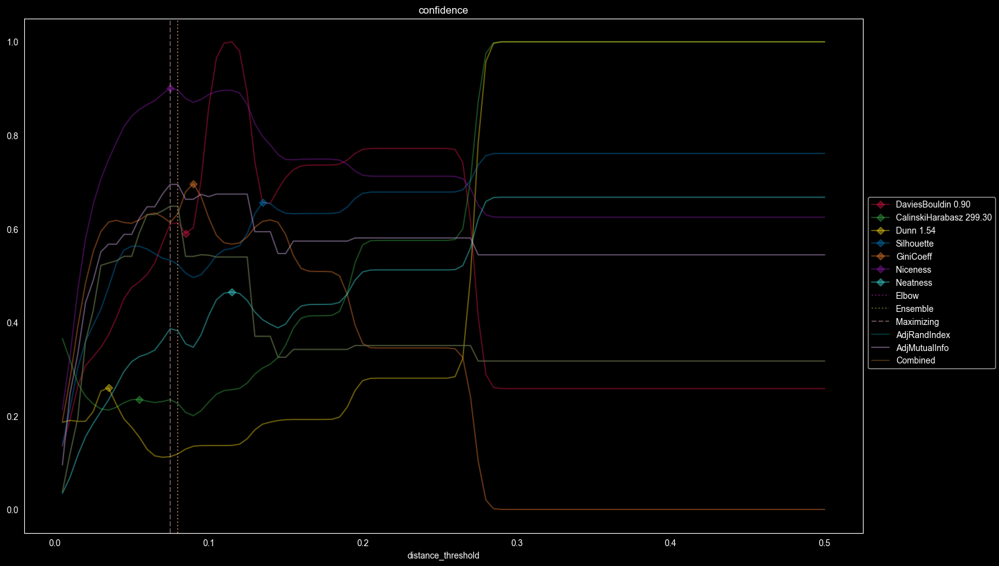

{'Silhouette': 0.5386730561899363, 'Niceness': 0.9137455908289241, 'GiniCoeff': 0.5906593406593407, 'Neatness': 0.4107435035971563, 'sample': {'distance_threshold': 0.075, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 4, 2: 1, 3: 1, 4: 2, 6: 1, 11: 1, 12: 1, 13: 2}, 'DaviesBouldin': 0.5803640673590792, 'CalinskiHarabasz': 72.82368552560986, 'Dunn': 0.17149427086019642, 'AdjRandIndex': 0.6483521570079614, 'AdjMutualInfo': 0.6951089231986718, 'Combined': 0.6483521570079614}
0    12
4    12
2    12
1    12
5    12
3    12
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.663285      0.541137  0.541137
CalinskiHarabasz       0.623106      0.591484  0.591484
Dunn                   0.567411      0.527009  0.527009
Silhouette             0.593935      0.370235  0.370235
GiniCoeff              0.663285      0.541137  0.541137
Niceness               0.695109      0.64

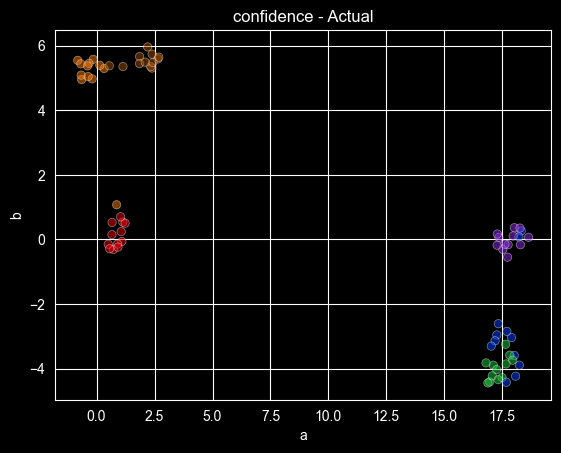

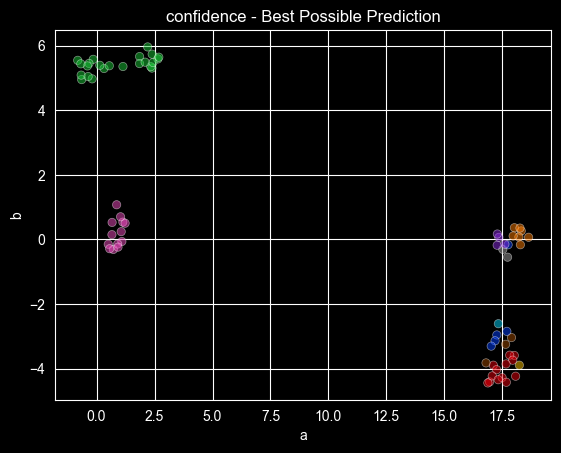

Dataset Summary
n   72.000000
d    3.000000
k    6.000000
e    1.791759
g    0.000000
Name: confidence, dtype: float64


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/366 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

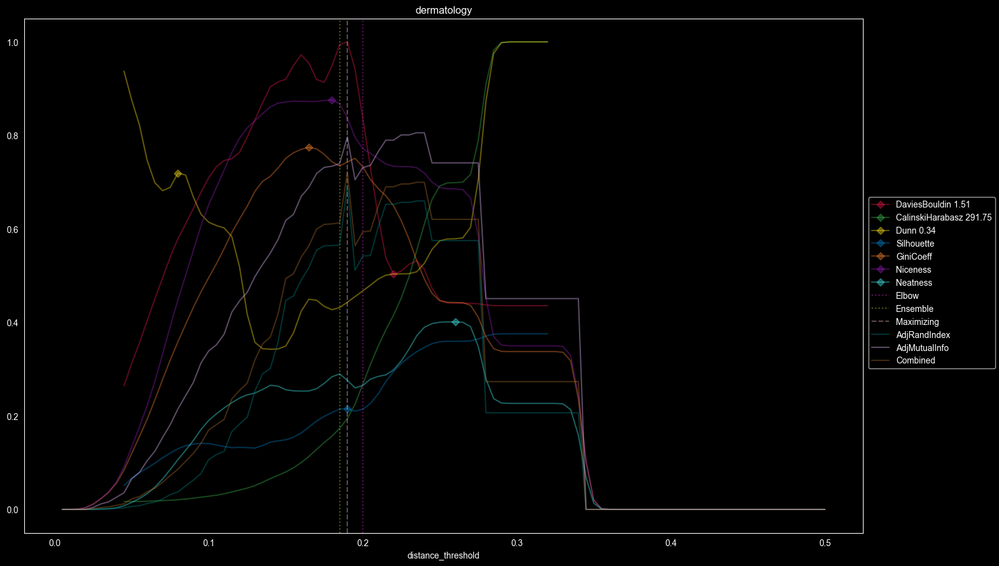

{'Silhouette': 0.22819660440245307, 'Niceness': 0.8556956315243281, 'GiniCoeff': 0.735745543814708, 'Neatness': 0.28510730979280263, 'sample': {'distance_threshold': 0.19, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 2: 2, 3: 1, 4: 1, 6: 1, 7: 1, 9: 2, 10: 1, 51: 1, 70: 1, 80: 1, 111: 1}, 'DaviesBouldin': 1.5391095516544766, 'CalinskiHarabasz': 56.891504105279026, 'Dunn': 0.15381978789421072, 'AdjRandIndex': 0.6931234679028697, 'AdjMutualInfo': 0.7965376419461051, 'Combined': 0.7213308456131363}
1    112
3     72
2     61
5     52
4     49
6     20
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.789748      0.652587  0.689999
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.214931      0.037551  0.085934
Silhouette             0.796538      0.693123  0.721331
GiniCoeff              0.688702      0.516915  0.563772
Nicenes

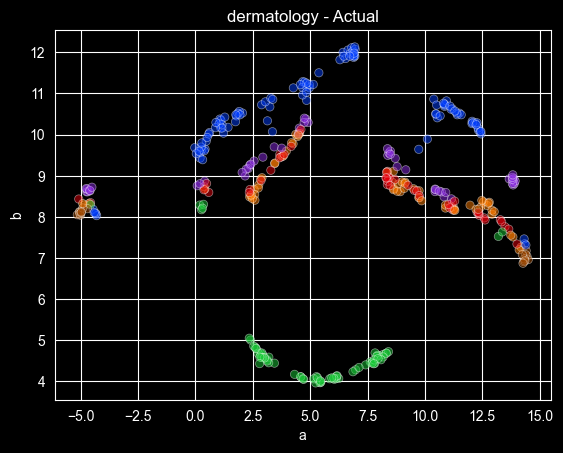

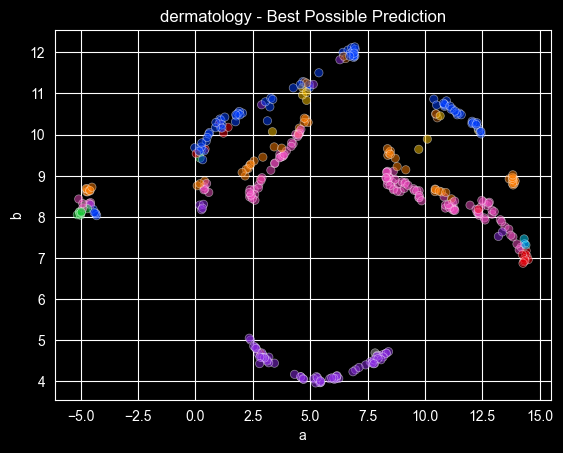

Dataset Summary
n   366.000000
d    34.000000
k     6.000000
e     1.686148
g     0.272761
Name: dermatology, dtype: float64


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/327 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

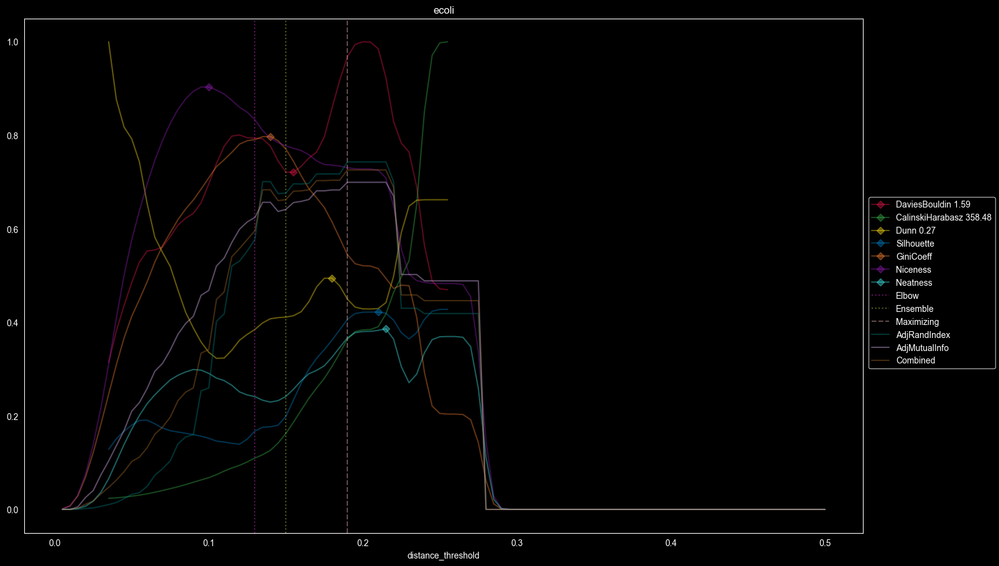

{'Silhouette': 0.4219515007893117, 'Niceness': 0.7279824810860065, 'GiniCoeff': 0.520845231296402, 'Neatness': 0.3806425326804621, 'sample': {'distance_threshold': 0.19, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {2: 1, 8: 1, 69: 1, 104: 1, 144: 1}, 'DaviesBouldin': 1.5871616742908332, 'CalinskiHarabasz': 137.74109906291056, 'Dunn': 0.114693919670522, 'AdjRandIndex': 0.7431364403991227, 'AdjMutualInfo': 0.6996032526550023, 'Combined': 0.7259518947859097}
0    143
1     77
7     52
4     35
5     20
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.656236      0.696324  0.680499
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.683211      0.717505  0.703968
Silhouette             0.699603      0.743136  0.725952
GiniCoeff              0.656778      0.701042  0.683569
Niceness               0.468428      0.259546  0.342002
Neatnes

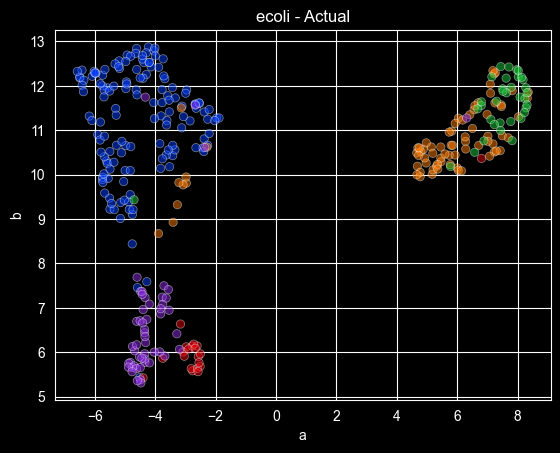

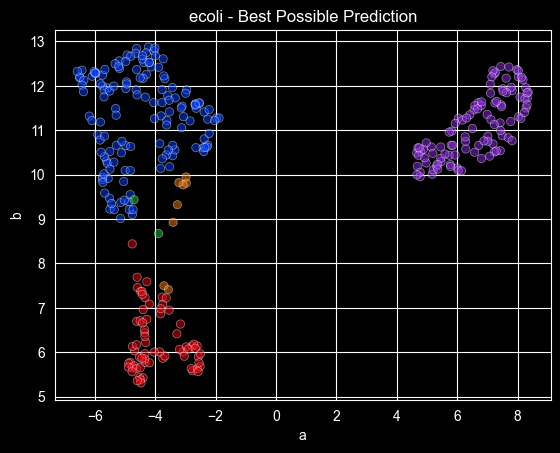

Dataset Summary
n   327.000000
d     7.000000
k     5.000000
e     1.404712
g     0.394746
Name: ecoli, dtype: float64


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/435 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

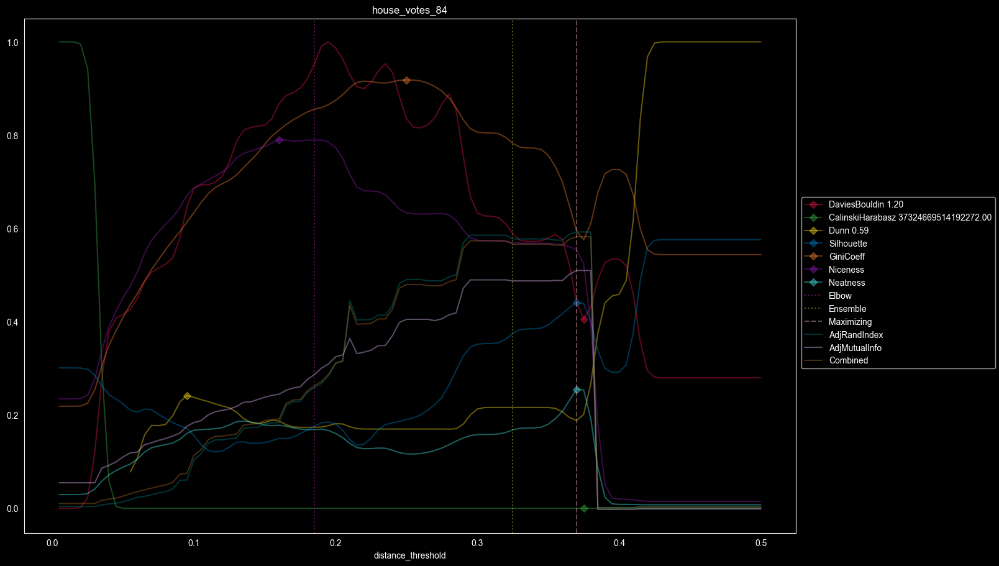

{'Silhouette': 0.4492397508735595, 'Niceness': 0.5544131685336512, 'GiniCoeff': 0.5598731884057971, 'Neatness': 0.2719375603682374, 'sample': {'distance_threshold': 0.37, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 3: 1, 202: 1, 229: 1}, 'DaviesBouldin': 0.4615165189415809, 'CalinskiHarabasz': 245.06245480682682, 'Dunn': 0.10862445414847162, 'AdjRandIndex': 0.5924979174356702, 'AdjMutualInfo': 0.5099929442682476, 'Combined': 0.5821399561304121}
0    267
1    168
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.509993      0.592498  0.582140
CalinskiHarabasz       0.509993      0.592498  0.582140
Dunn                   0.176191      0.060948  0.075416
Silhouette             0.509993      0.592498  0.582140
GiniCoeff              0.405272      0.490487  0.479788
Niceness               0.244802      0.183869  0.191519
Neatness               0.509993      0

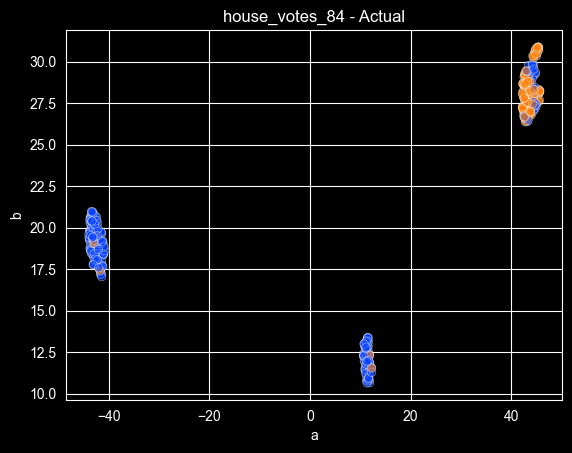

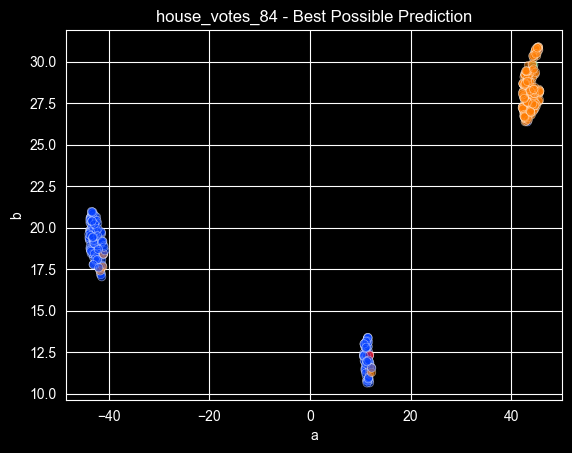

Dataset Summary
n   435.000000
d    16.000000
k     2.000000
e     0.667021
g     0.125543
Name: house_votes_84, dtype: float64


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

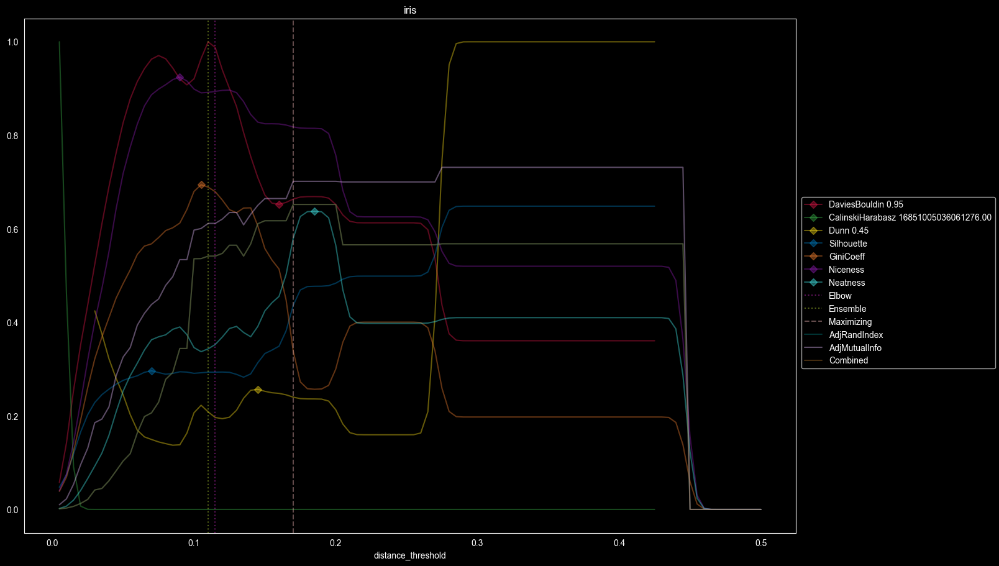

{'Silhouette': 0.47726025597204835, 'Niceness': 0.8149998805271983, 'GiniCoeff': 0.25691699604743085, 'Neatness': 0.6376183780066198, 'sample': {'distance_threshold': 0.17, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {12: 1, 37: 1, 50: 1, 51: 1}, 'DaviesBouldin': 0.6351305231513197, 'CalinskiHarabasz': 177.3000669371337, 'Dunn': 0.10700266270366074, 'AdjRandIndex': 0.6521833727068936, 'AdjMutualInfo': 0.7016361903834069, 'Combined': 0.6521833727068936}
2    50
1    50
0    50
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.664815      0.617387  0.617387
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.650256      0.610891  0.610891
Silhouette             0.438265      0.206509  0.206509
GiniCoeff              0.600852      0.536387  0.536387
Niceness               0.534188      0.344215  0.344215
Neatness               0.701636

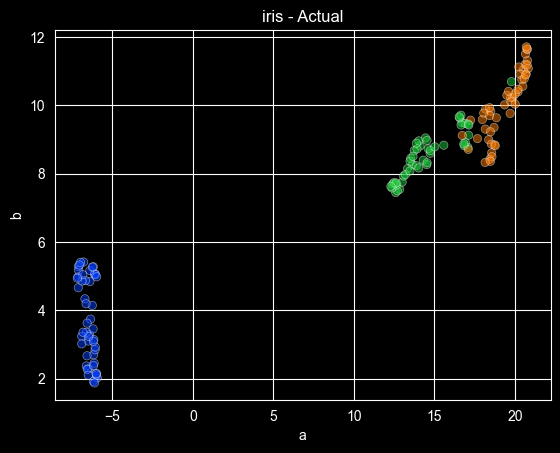

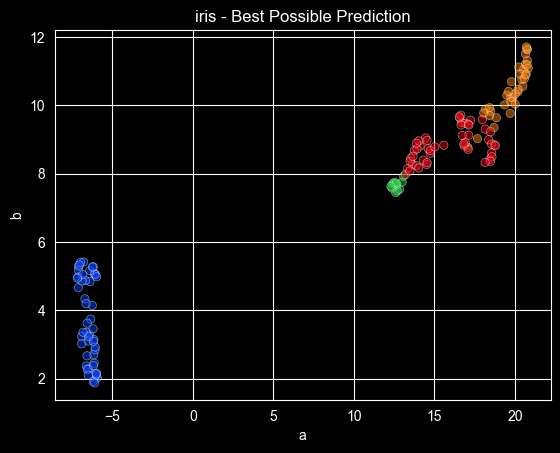

Dataset Summary
n   150.000000
d     4.000000
k     3.000000
e     1.098612
g     0.000000
Name: iris, dtype: float64


  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

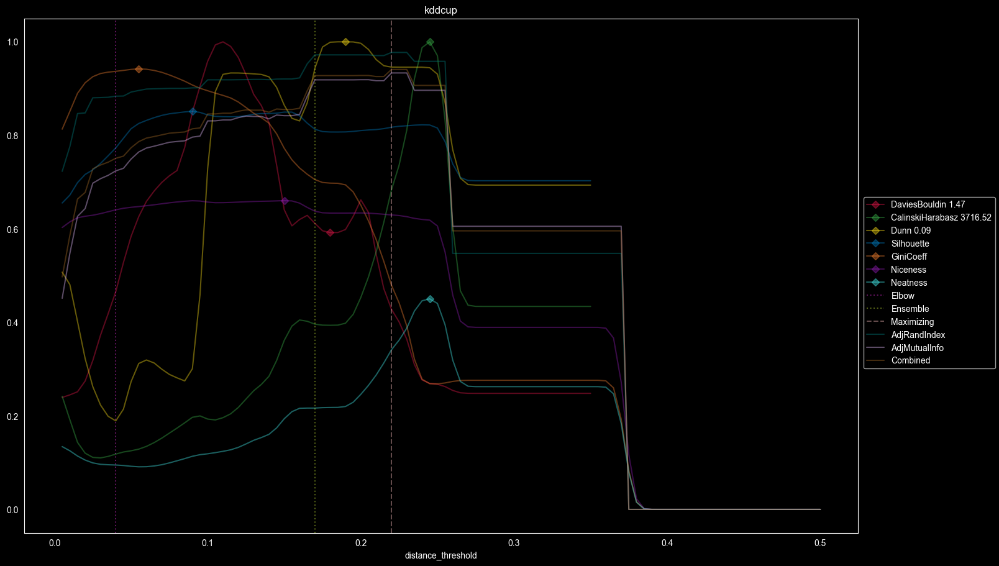

{'Silhouette': 0.8196270461561581, 'Niceness': 0.628834376187744, 'GiniCoeff': 0.4452146094374833, 'Neatness': 0.3605332368093885, 'sample': {'distance_threshold': 0.22, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {21: 1, 191: 1, 220: 1, 568: 1}, 'DaviesBouldin': 0.5961292220614365, 'CalinskiHarabasz': 2710.9067623836904, 'Dunn': 0.08290016525506975, 'AdjRandIndex': 0.9772833727498358, 'AdjMutualInfo': 0.9334349029298562, 'Combined': 0.9408196734584192}
18    568
9     217
11    197
0       4
5       3
17      3
20      2
21      2
15      2
14      1
10      1
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.918714      0.972112  0.927707
CalinskiHarabasz       0.896283      0.958279  0.906724
Dunn                   0.918714      0.972112  0.927707
Silhouette             0.796191      0.901528  0.813932
GiniCoeff              0.764451      0.895935  0.786595


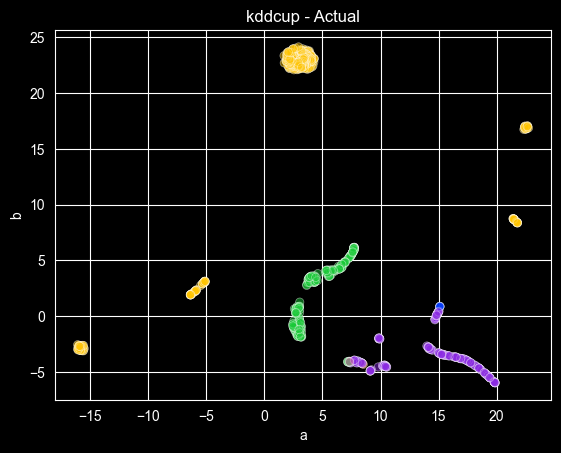

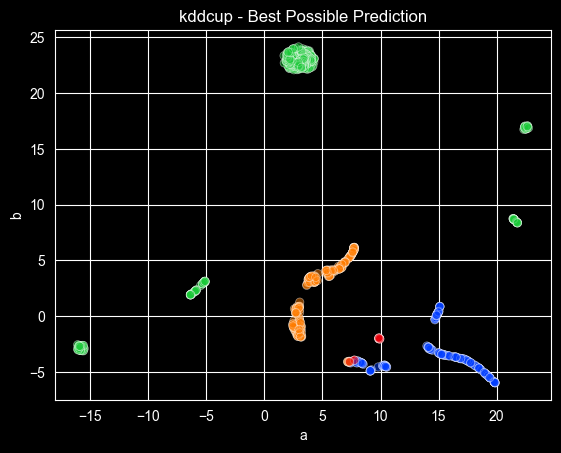

Dataset Summary
n   1000.000000
d     41.000000
k     11.000000
e      1.080906
g      0.831584
Name: kddcup, dtype: float64


  0%|          | 0/216 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

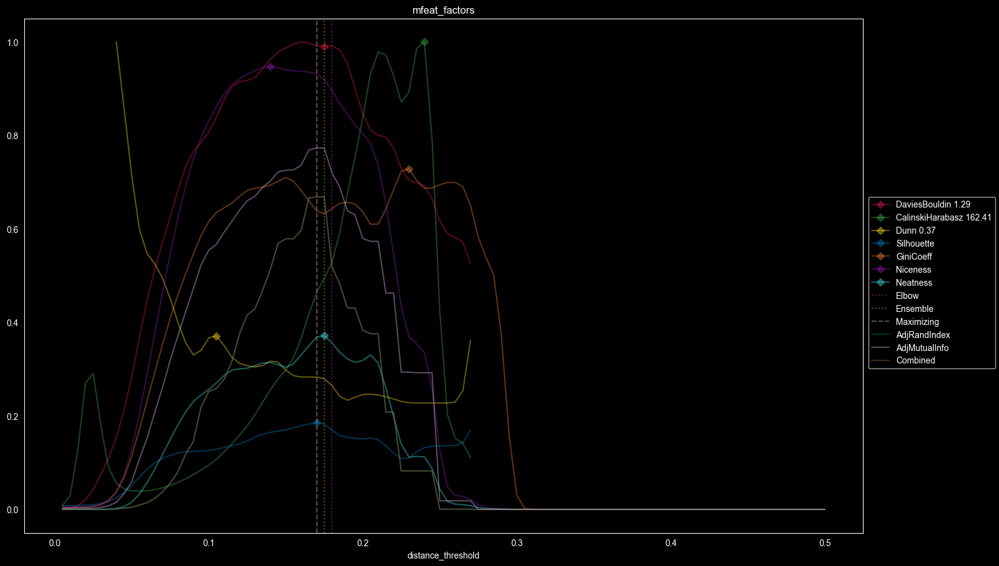

{'Silhouette': 0.1909285734133719, 'Niceness': 0.9343449050122189, 'GiniCoeff': 0.6213131043842854, 'Neatness': 0.3846278793519893, 'sample': {'distance_threshold': 0.17, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 4, 3: 2, 4: 1, 10: 1, 11: 1, 12: 1, 14: 1, 15: 1, 43: 1, 57: 1, 64: 1, 76: 1, 81: 1, 94: 1, 96: 1, 99: 1, 109: 1, 205: 1}, 'DaviesBouldin': 1.2670332272078946, 'CalinskiHarabasz': 79.06253697999362, 'Dunn': 0.10365713594598473, 'AdjRandIndex': 0.6685656247852217, 'AdjMutualInfo': 0.7730244129729194, 'Combined': 0.6685656247852217}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.773024      0.668566  0.668566
CalinskiHarabasz       0.292305      0.082366  0.082366
Dunn                   0.567121      0.258663  0.258663
Silhouette             0.773024      0

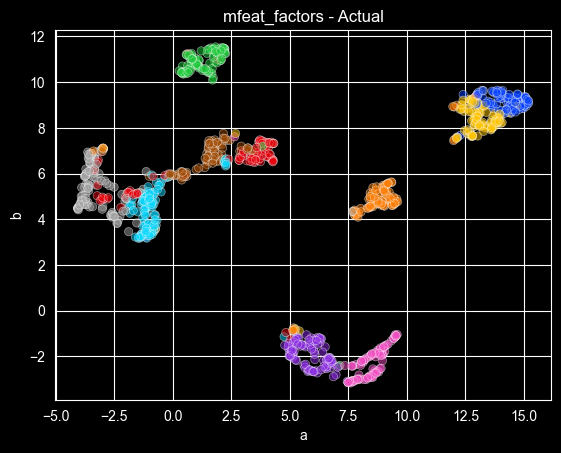

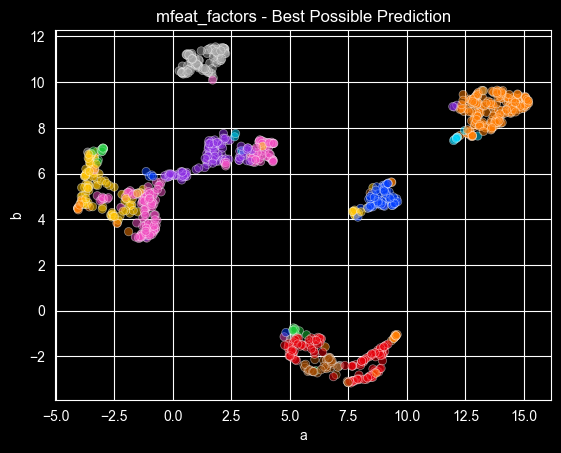

Dataset Summary
n   1000.000000
d    216.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_factors, dtype: float64


  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

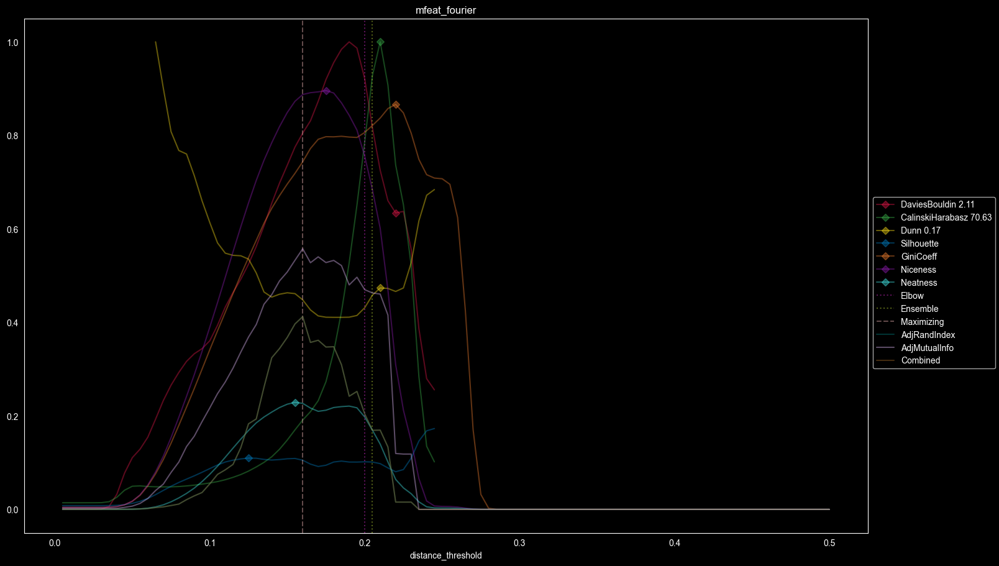

{'Silhouette': 0.11230472286522278, 'Niceness': 0.8984567083301114, 'GiniCoeff': 0.7304185550519862, 'Neatness': 0.2392645846608835, 'sample': {'distance_threshold': 0.16, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 36, 2: 21, 3: 13, 4: 10, 5: 6, 6: 3, 7: 4, 8: 2, 9: 4, 10: 1, 11: 3, 13: 1, 14: 1, 16: 1, 17: 2, 21: 1, 26: 2, 27: 1, 28: 1, 34: 1, 35: 1, 45: 1, 65: 1, 91: 1, 98: 1, 99: 1}, 'DaviesBouldin': 1.7274408161772254, 'CalinskiHarabasz': 13.974713661350428, 'Dunn': 0.07800030239310357, 'AdjRandIndex': 0.4122044348623299, 'AdjMutualInfo': 0.557414731125357, 'Combined': 0.4122044348623299}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.119510      0.015584  0.015584
CalinskiHarabasz       0.460533      0.169504  0.169504
Dunn                   0.460533      0.16

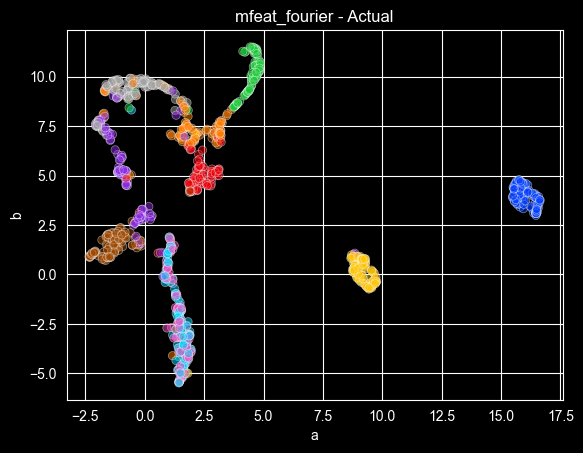

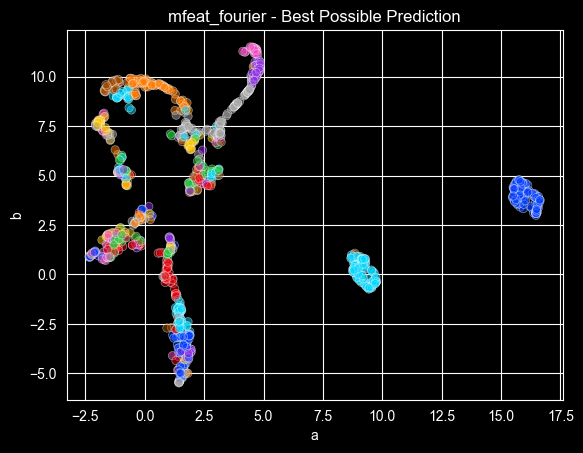

Dataset Summary
n   1000.000000
d     76.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_fourier, dtype: float64


  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

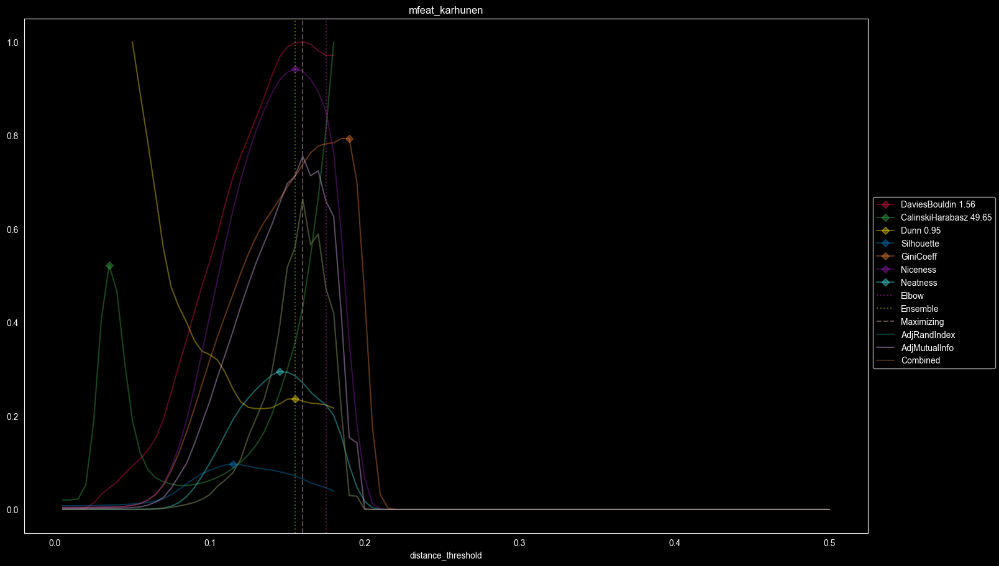

{'Silhouette': 0.06686943155973472, 'Niceness': 0.9481096844799226, 'GiniCoeff': 0.7340200189040498, 'Neatness': 0.2763598578714648, 'sample': {'distance_threshold': 0.16, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 14, 2: 8, 3: 2, 4: 7, 6: 3, 9: 1, 10: 1, 12: 1, 13: 1, 14: 1, 16: 2, 18: 1, 20: 1, 33: 1, 43: 1, 45: 1, 49: 1, 54: 1, 64: 1, 65: 1, 81: 1, 82: 1, 88: 1, 89: 1, 97: 1}, 'DaviesBouldin': 1.5512739069616863, 'CalinskiHarabasz': 20.31753615972842, 'Dunn': 0.22241315613165102, 'AdjRandIndex': 0.6640914059208975, 'AdjMutualInfo': 0.7557528439692964, 'Combined': 0.6640914059208975}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.000000      0.000000  0.000000
CalinskiHarabasz       0.002709      0.000182  0.000182
Dunn                   0.712859      0.560087  0

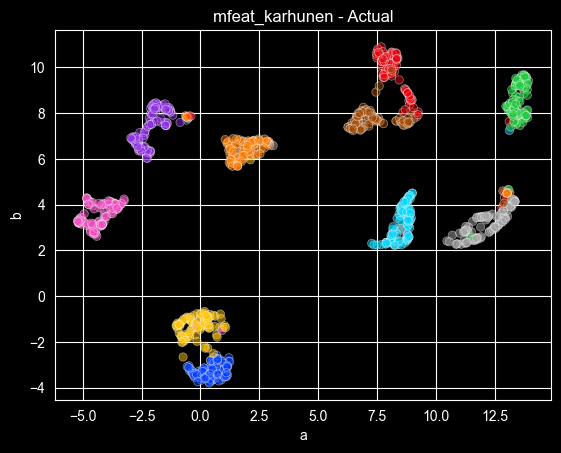

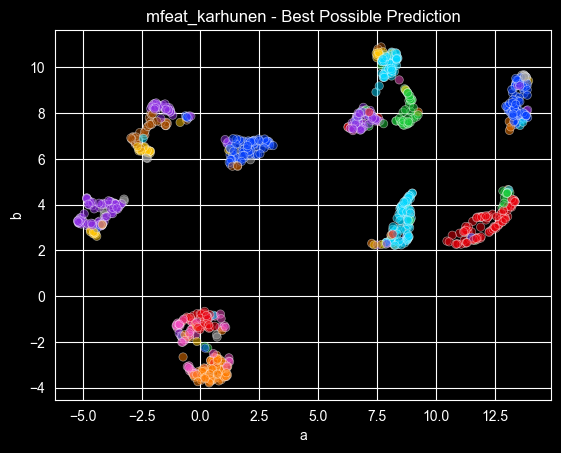

Dataset Summary
n   1000.000000
d     64.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_karhunen, dtype: float64


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

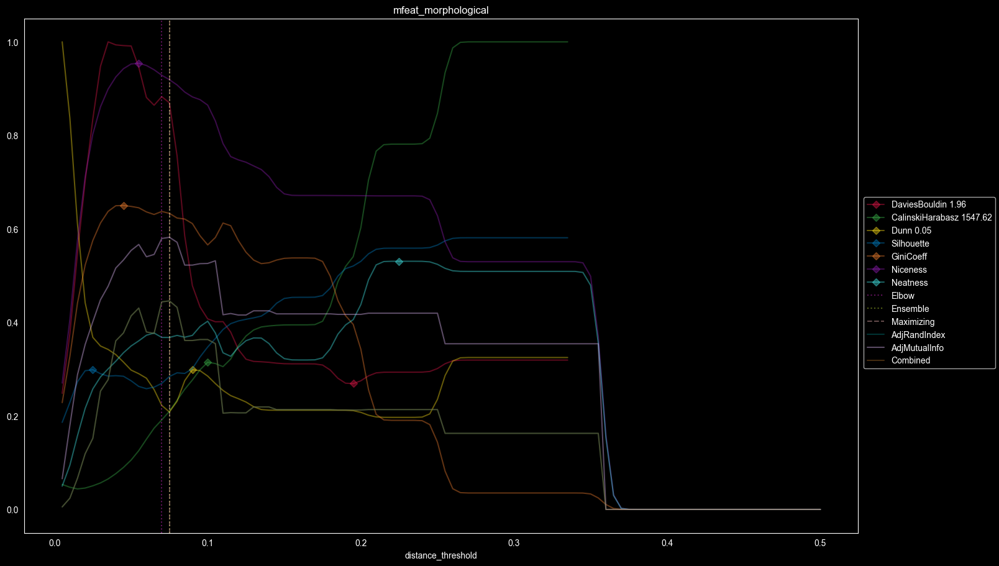

{'Silhouette': 0.29417133362190273, 'Niceness': 0.9210483235922831, 'GiniCoeff': 0.6326453296664749, 'Neatness': 0.3690206458055882, 'sample': {'distance_threshold': 0.075, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 3, 2: 1, 3: 1, 5: 1, 11: 1, 12: 1, 16: 1, 21: 1, 37: 1, 40: 1, 71: 1, 88: 1, 99: 1, 100: 1, 127: 1, 171: 1, 194: 1}, 'DaviesBouldin': 1.840688868912426, 'CalinskiHarabasz': 319.291818258178, 'Dunn': 0.009758362563301768, 'AdjRandIndex': 0.4460201745529821, 'AdjMutualInfo': 0.5820250028667019, 'Combined': 0.4460201745529821}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.417189      0.212661  0.212661
CalinskiHarabasz       0.526080      0.363401  0.363401
Dunn                   0.522580      0.361308  0.361308
Silhouette             0.401616      0.1521

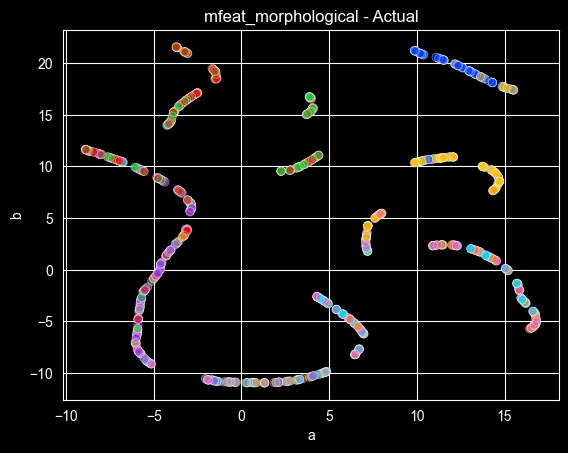

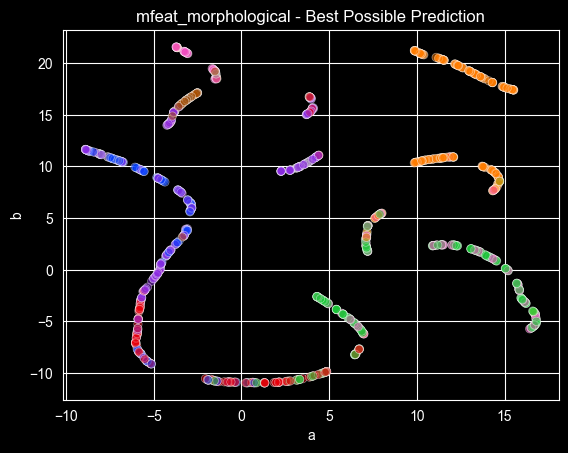

Dataset Summary
n   1000.000000
d      6.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_morphological, dtype: float64


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

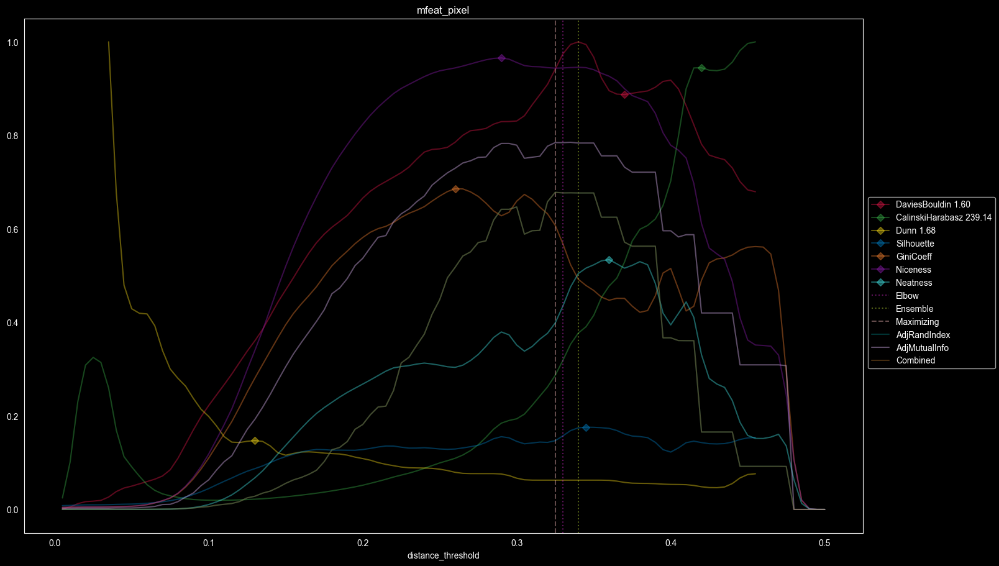

{'Silhouette': 0.14361141338278594, 'Niceness': 0.9427662997458479, 'GiniCoeff': 0.6135871014106383, 'Neatness': 0.39320234912526764, 'sample': {'distance_threshold': 0.325, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 2: 1, 3: 2, 5: 1, 6: 1, 7: 1, 9: 1, 10: 1, 11: 1, 12: 1, 27: 1, 34: 1, 54: 1, 71: 1, 75: 1, 88: 1, 95: 2, 96: 1, 131: 1, 164: 1}, 'DaviesBouldin': 1.5138341423179018, 'CalinskiHarabasz': 68.0439525825315, 'Dunn': 0.10529303185112487, 'AdjRandIndex': 0.6781970040401452, 'AdjMutualInfo': 0.7845445056538018, 'Combined': 0.6781970040401452}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.731995      0.571609  0.571609
CalinskiHarabasz       0.420192      0.165565  0.165565
Dunn                   0.192866      0.028251  0.028251
Silhouette             0.7

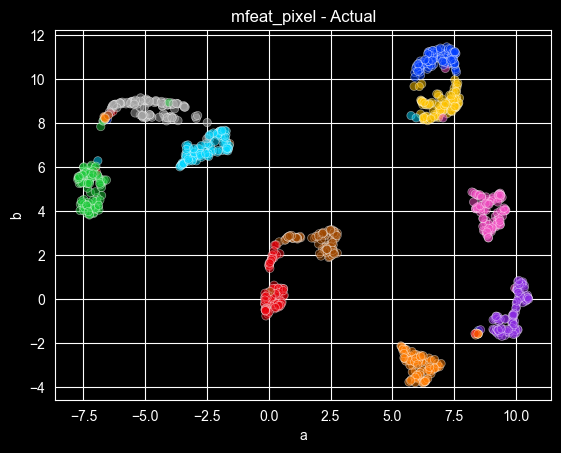

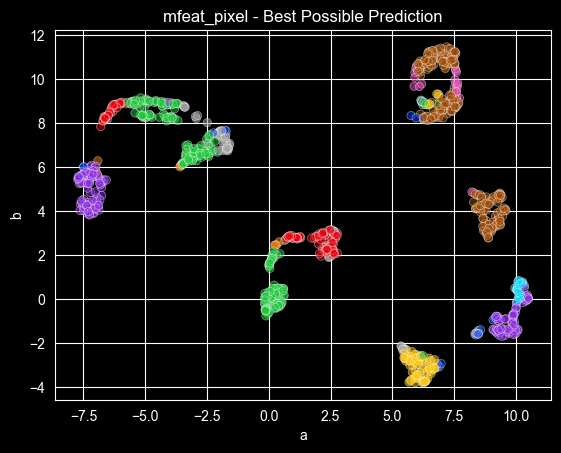

Dataset Summary
n   1000.000000
d    240.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_pixel, dtype: float64


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/215 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

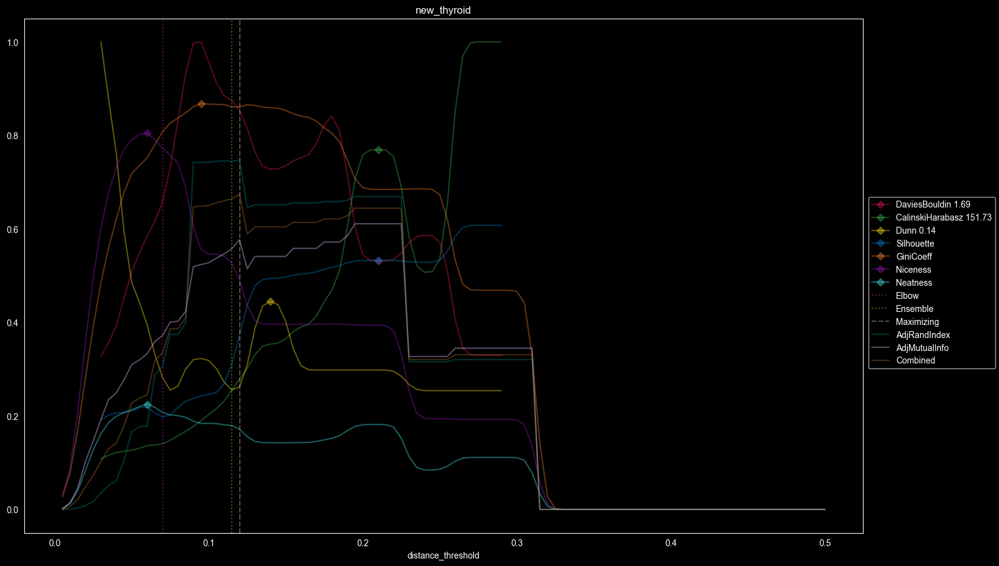

{'Silhouette': 0.3487242085898186, 'Niceness': 0.5305229485396384, 'GiniCoeff': 0.8454545454545455, 'Neatness': 0.18603263678842008, 'sample': {'distance_threshold': 0.12, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 2: 2, 3: 2, 5: 1, 7: 1, 10: 1, 11: 1, 19: 1, 152: 1}, 'DaviesBouldin': 1.4074457183575761, 'CalinskiHarabasz': 44.94764611057021, 'Dunn': 0.036276917505922886, 'AdjRandIndex': 0.7472396095182403, 'AdjMutualInfo': 0.5766370238441718, 'Combined': 0.6741242156579252}
1    150
2     35
3     30
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.610998      0.669233  0.644276
CalinskiHarabasz       0.610998      0.669233  0.644276
Dunn                   0.541147      0.651638  0.604285
Silhouette             0.610998      0.669233  0.644276
GiniCoeff              0.523722      0.742320  0.648635
Niceness               0.333024      0.178540  0.2447

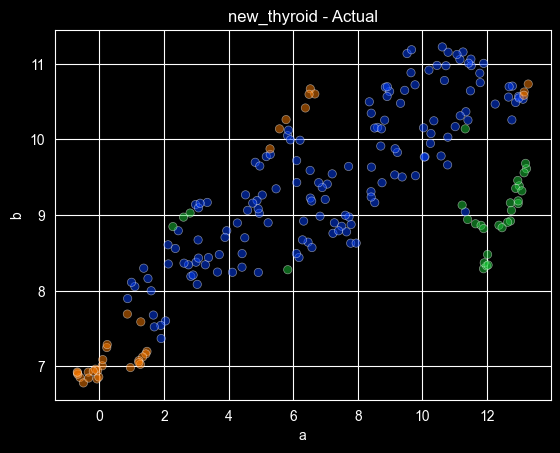

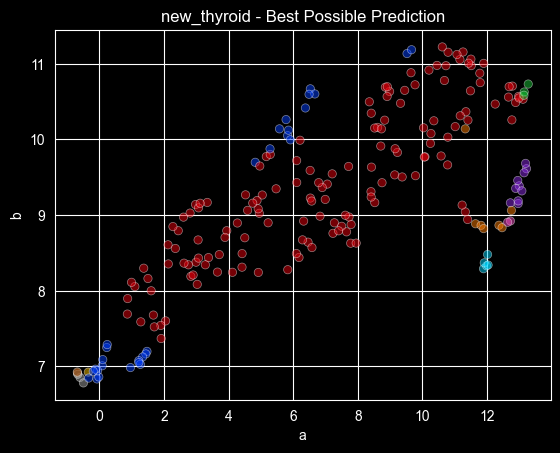

Dataset Summary
n   215.000000
d     5.000000
k     3.000000
e     0.821483
g     0.428571
Name: new_thyroid, dtype: float64


  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

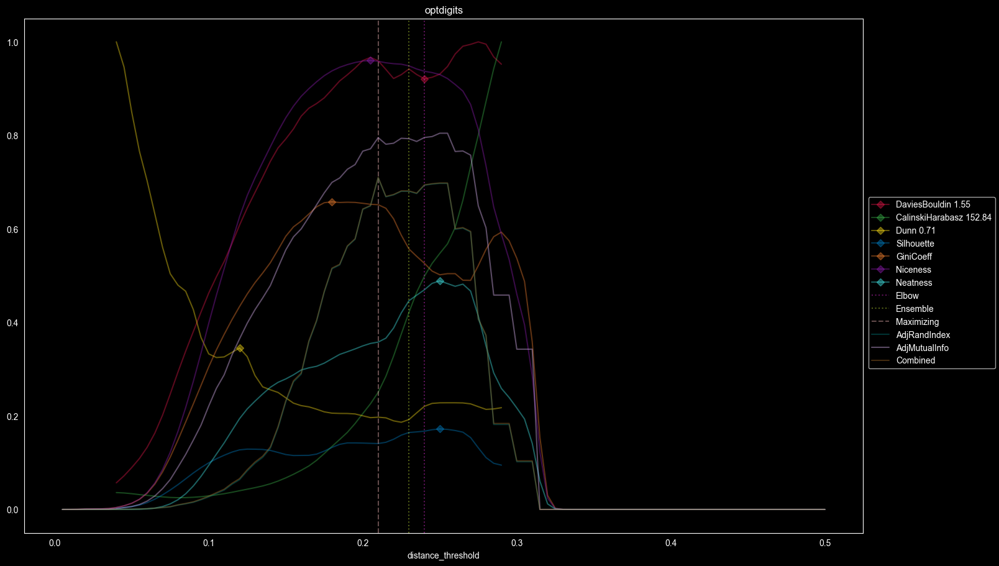

{'Silhouette': 0.13581742464671387, 'Niceness': 0.9596154491565222, 'GiniCoeff': 0.6599085772249351, 'Neatness': 0.3504120473760285, 'sample': {'distance_threshold': 0.21, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 7, 2: 2, 3: 2, 4: 3, 5: 1, 6: 3, 7: 2, 9: 1, 10: 1, 11: 1, 12: 1, 13: 1, 15: 1, 19: 2, 20: 1, 24: 1, 40: 1, 48: 1, 58: 1, 63: 1, 68: 1, 71: 1, 78: 1, 81: 1, 86: 1, 94: 1, 95: 1}, 'DaviesBouldin': 1.4746218243378004, 'CalinskiHarabasz': 36.934071755646514, 'Dunn': 0.1434524535666869, 'AdjRandIndex': 0.7095530407041443, 'AdjMutualInfo': 0.7951481689361749, 'Combined': 0.7102284914627868}
3    102
1    102
7    101
4    101
9    100
2     99
6     99
8     99
5     99
0     98
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.795425      0.693269  0.694075
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.364908      

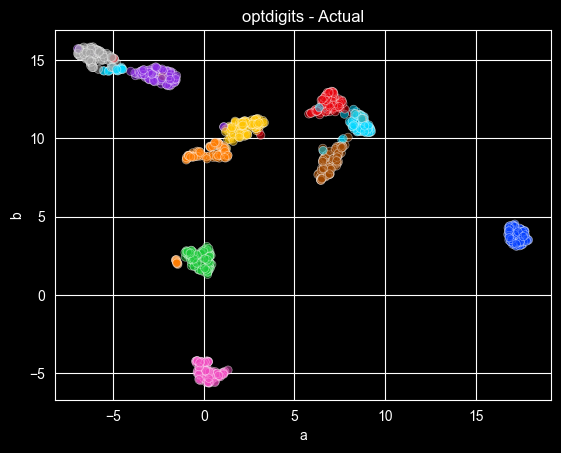

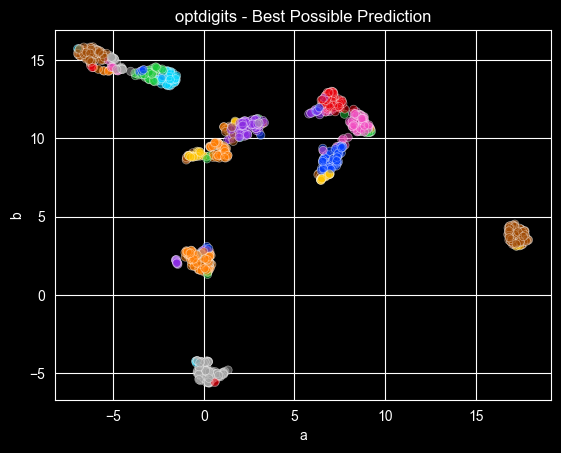

Dataset Summary
n   1000.000000
d     64.000000
k     10.000000
e      2.302495
g      0.007891
Name: optdigits, dtype: float64


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

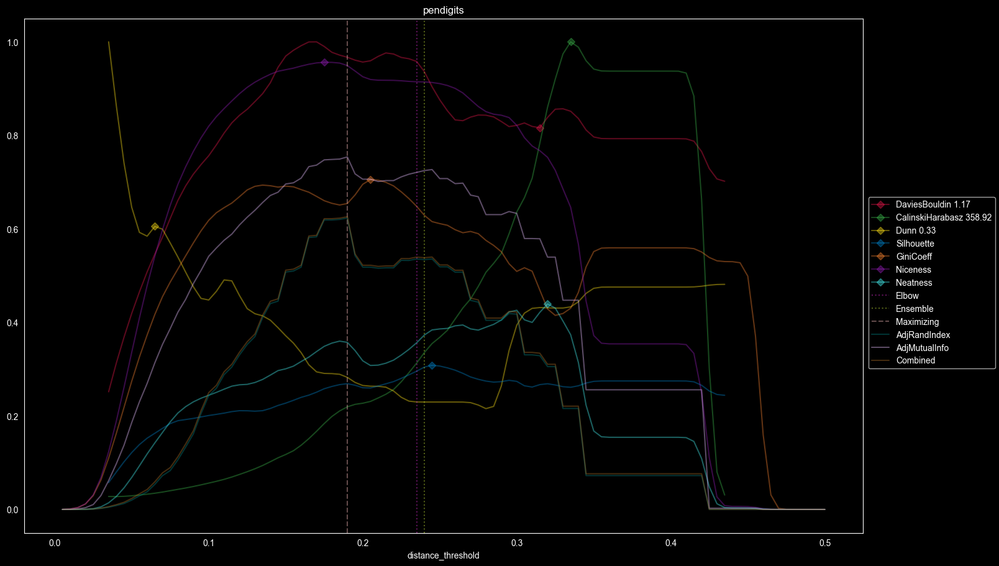

{'Silhouette': 0.27399100743796057, 'Niceness': 0.9563948544295543, 'GiniCoeff': 0.6384493546818888, 'Neatness': 0.3724477179550388, 'sample': {'distance_threshold': 0.19, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 3, 2: 4, 3: 2, 5: 2, 9: 1, 10: 3, 11: 1, 12: 2, 15: 1, 17: 2, 18: 1, 23: 1, 25: 1, 35: 1, 62: 2, 66: 1, 68: 1, 70: 1, 80: 1, 96: 1, 122: 1, 123: 1}, 'DaviesBouldin': 1.1291975018463036, 'CalinskiHarabasz': 79.68875468464225, 'Dunn': 0.09536801649849021, 'AdjRandIndex': 0.6232675696496791, 'AdjMutualInfo': 0.7538909187493343, 'Combined': 0.6260534581935266}
2    104
4    104
1    104
0    104
7    104
3     96
8     96
6     96
5     96
9     96
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.578865      0.328726  0.334061
CalinskiHarabasz       0.447439      0.215930  0.220868
Dunn                   0.313411      0.053502  0.059045
Silhouette 

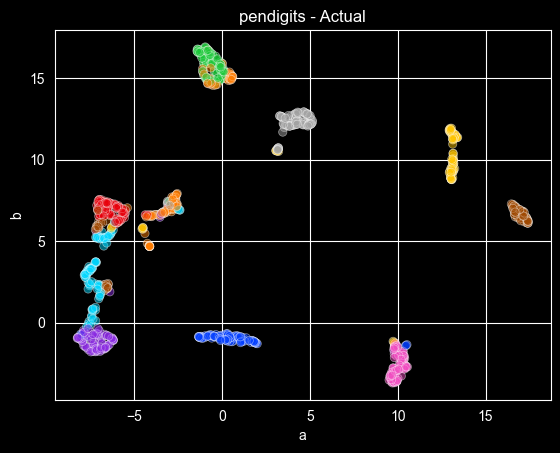

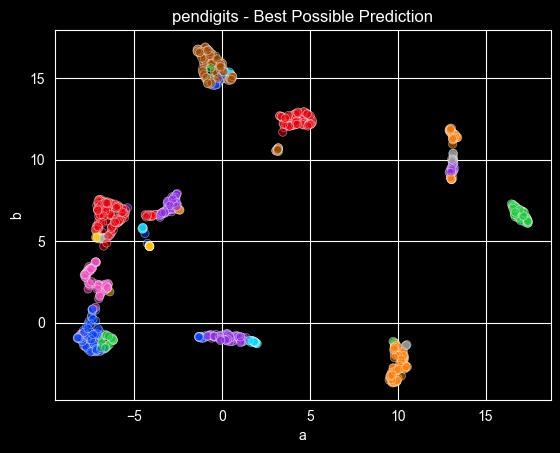

Dataset Summary
n   1000.000000
d     16.000000
k     10.000000
e      2.301785
g      0.021328
Name: pendigits, dtype: float64


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/333 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

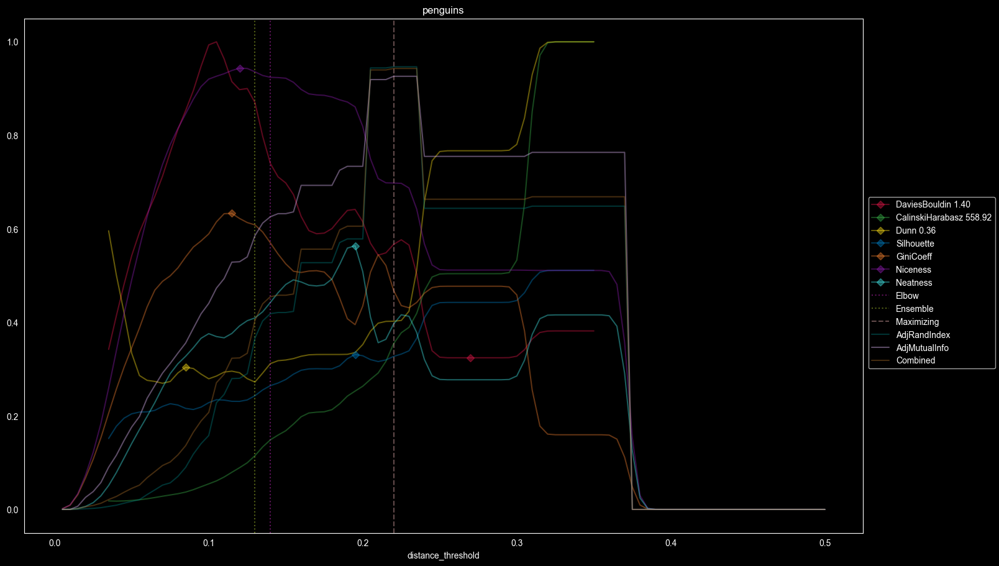

{'Silhouette': 0.3328398142200902, 'Niceness': 0.6982909573948878, 'GiniCoeff': 0.42773109243697477, 'Neatness': 0.42187556561970646, 'sample': {'distance_threshold': 0.22, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 62: 1, 118: 1, 152: 1}, 'DaviesBouldin': 0.8138402822373236, 'CalinskiHarabasz': 213.9229383675387, 'Dunn': 0.14356843354811952, 'AdjRandIndex': 0.9465809308898748, 'AdjMutualInfo': 0.9262724111768521, 'Combined': 0.9430312064358338}
0    146
2    119
1     68
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.754979      0.643956  0.663361
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.355795      0.089891  0.136369
Silhouette             0.733783      0.578489  0.605633
GiniCoeff              0.528823      0.279786  0.323315
Niceness               0.529685      0.280420  0.323989
Neatness               0.73

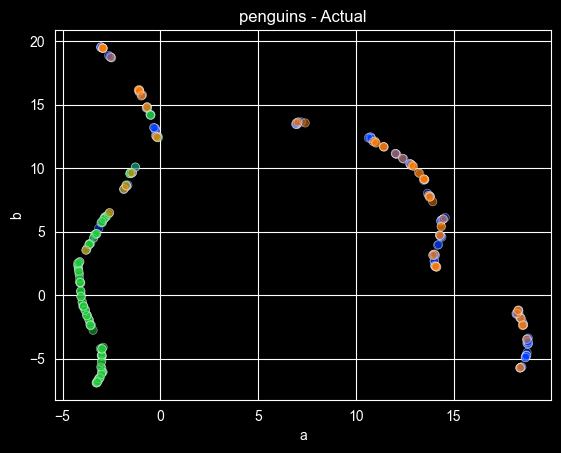

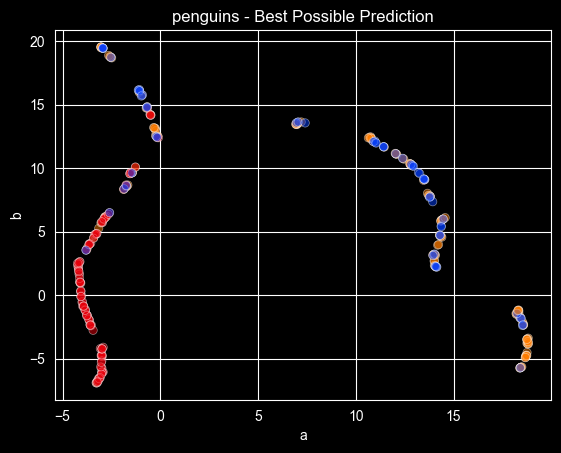

Dataset Summary
n   333.000000
d     7.000000
k     3.000000
e     1.053642
g     0.174790
Name: penguins, dtype: float64


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

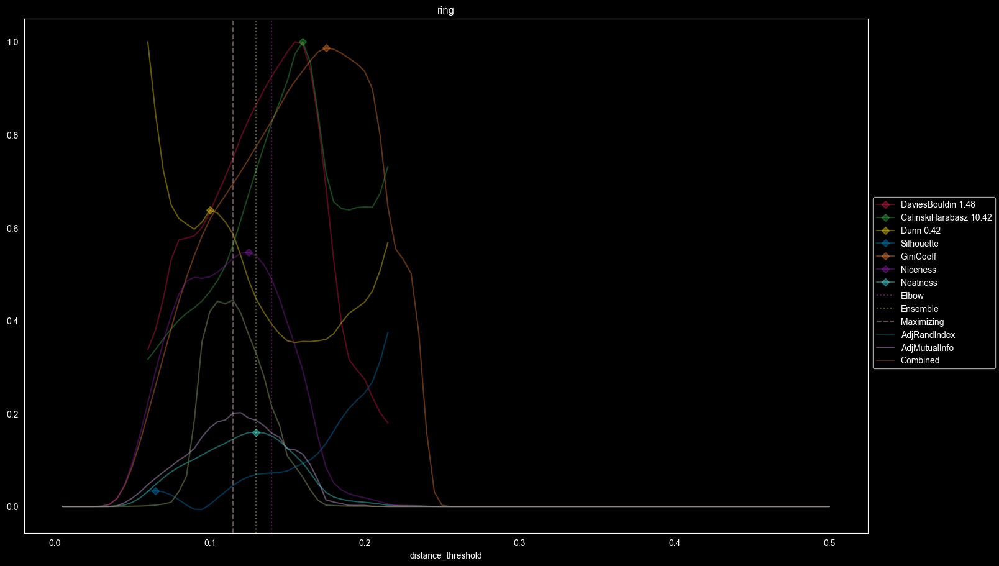

{'Silhouette': 0.047214676384406185, 'Niceness': 0.5368096420052261, 'GiniCoeff': 0.694152147662584, 'Neatness': 0.14347443134016016, 'sample': {'distance_threshold': 0.115, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 202, 2: 67, 3: 17, 4: 13, 5: 5, 13: 1, 523: 1}, 'DaviesBouldin': 1.0919379475458135, 'CalinskiHarabasz': 5.778275562309013, 'Dunn': 0.2569709991531378, 'AdjRandIndex': 0.4447467977622441, 'AdjMutualInfo': 0.20067298696782043, 'Combined': 0.4434454178059955}
1    505
0    495
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.000000      0.000000  0.000000
CalinskiHarabasz       0.112578      0.063311  0.063574
Dunn                   0.169385      0.420009  0.418672
Silhouette             0.060849      0.002599  0.002910
GiniCoeff              0.014334      0.002834  0.002895
Niceness               0.190444      0.371063  0.370099
Neatness      

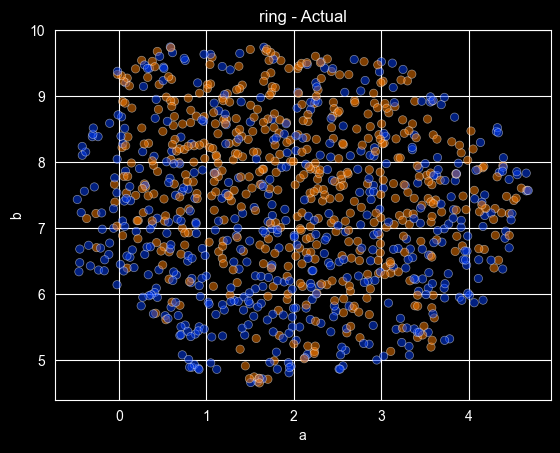

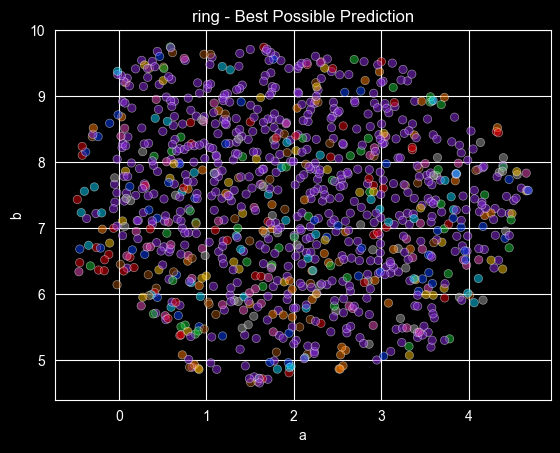

Dataset Summary
n   1000.000000
d     20.000000
k      2.000000
e      0.693097
g      0.005332
Name: ring, dtype: float64


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

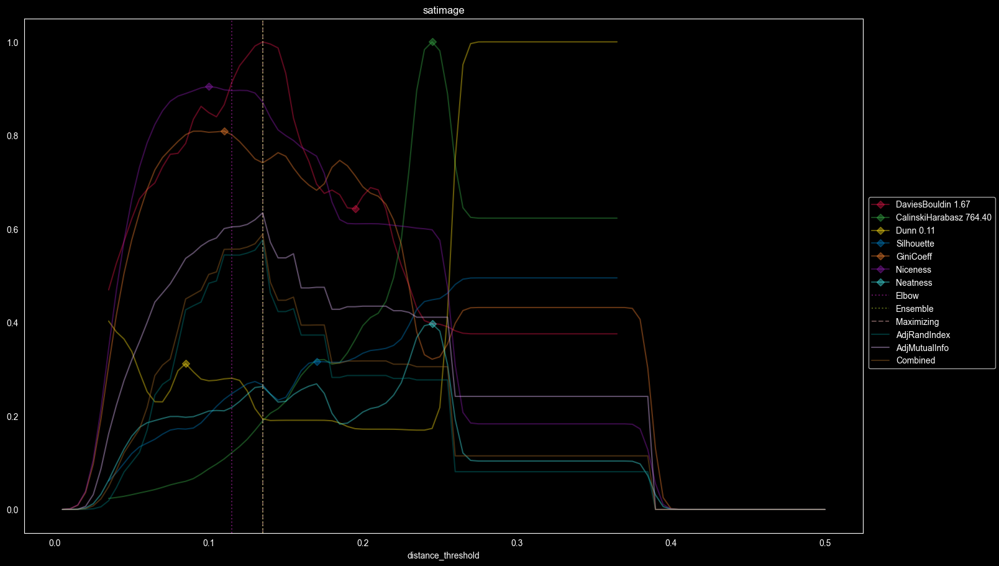

{'Silhouette': 0.28507588322831323, 'Niceness': 0.889773402083625, 'GiniCoeff': 0.7210877099440149, 'Neatness': 0.28409789759200743, 'sample': {'distance_threshold': 0.135, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 2: 2, 3: 2, 5: 4, 6: 3, 11: 1, 63: 1, 65: 1, 126: 1, 130: 1, 133: 1, 204: 1, 219: 1}, 'DaviesBouldin': 1.707129871675504, 'CalinskiHarabasz': 144.32861414114782, 'Dunn': 0.021252930823301597, 'AdjRandIndex': 0.5764374573323956, 'AdjMutualInfo': 0.634382201602045, 'Combined': 0.5886309305777995}
1    238
7    235
3    211
5    110
2    109
4     97
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.433536      0.286416  0.317375
CalinskiHarabasz       0.411090      0.277031  0.305241
Dunn                   0.536923      0.427000  0.450132
Silhouette             0.475110      0.372935  0.394436
GiniCoeff              0.600681      0.544261  0.5

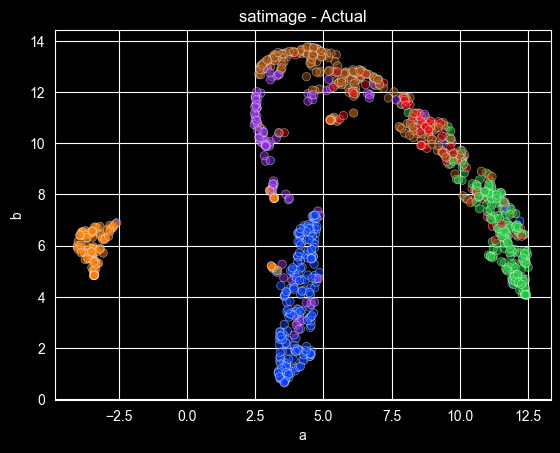

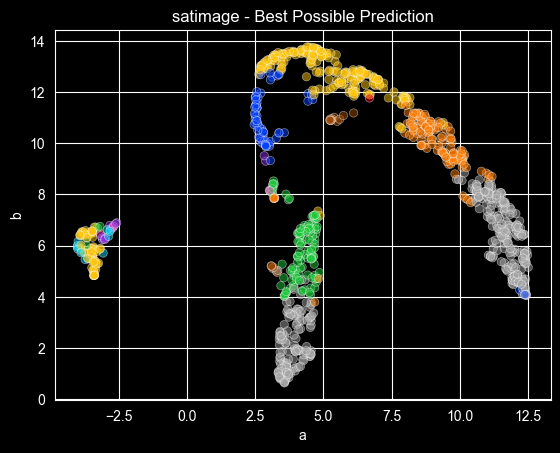

Dataset Summary
n   1000.000000
d     36.000000
k      6.000000
e      1.720953
g      0.210433
Name: satimage, dtype: float64


  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

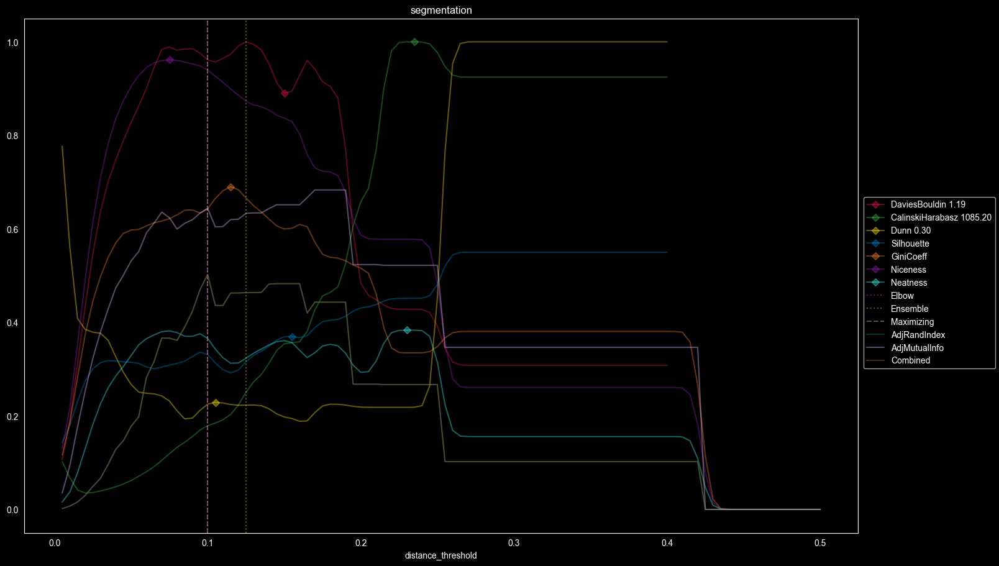

{'Silhouette': 0.3454612679342304, 'Niceness': 0.9464280424996756, 'GiniCoeff': 0.6259237536656892, 'Neatness': 0.3827350545299145, 'sample': {'distance_threshold': 0.1, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 3, 2: 2, 3: 2, 5: 2, 7: 1, 10: 1, 18: 1, 19: 1, 26: 2, 36: 1, 39: 1, 43: 1, 83: 1, 99: 1, 101: 1, 105: 1, 106: 1, 122: 1, 137: 1}, 'DaviesBouldin': 1.141166245172919, 'CalinskiHarabasz': 195.92999480204776, 'Dunn': 0.06794849186349322, 'AdjRandIndex': 0.5023880466097341, 'AdjMutualInfo': 0.6440153346904408, 'Combined': 0.5025174998951033}
6    143
2    143
4    143
3    143
5    143
1    143
0    142
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.651538      0.482777  0.482931
CalinskiHarabasz       0.522126      0.266919  0.267152
Dunn                   0.604247      0.436011  0.436165
Silhouette             0.651538      0.482777  0.482931
Gi

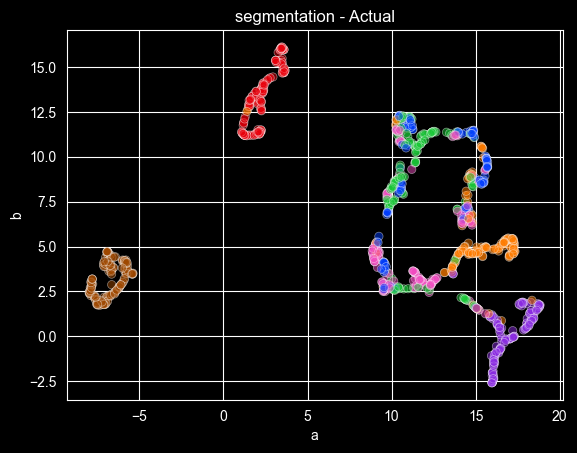

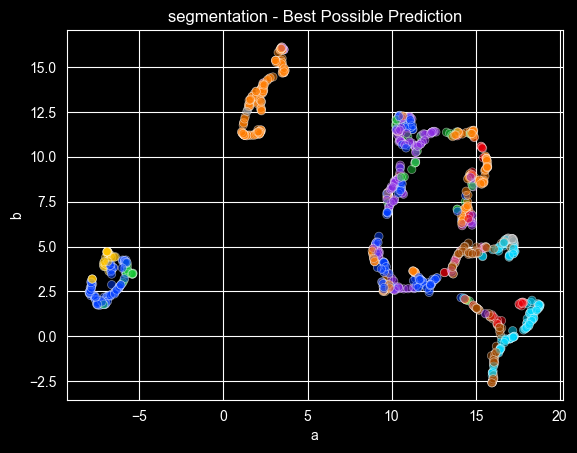

Dataset Summary
n   1000.000000
d     19.000000
k      7.000000
e      1.945907
g      0.000914
Name: segmentation, dtype: float64


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/675 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

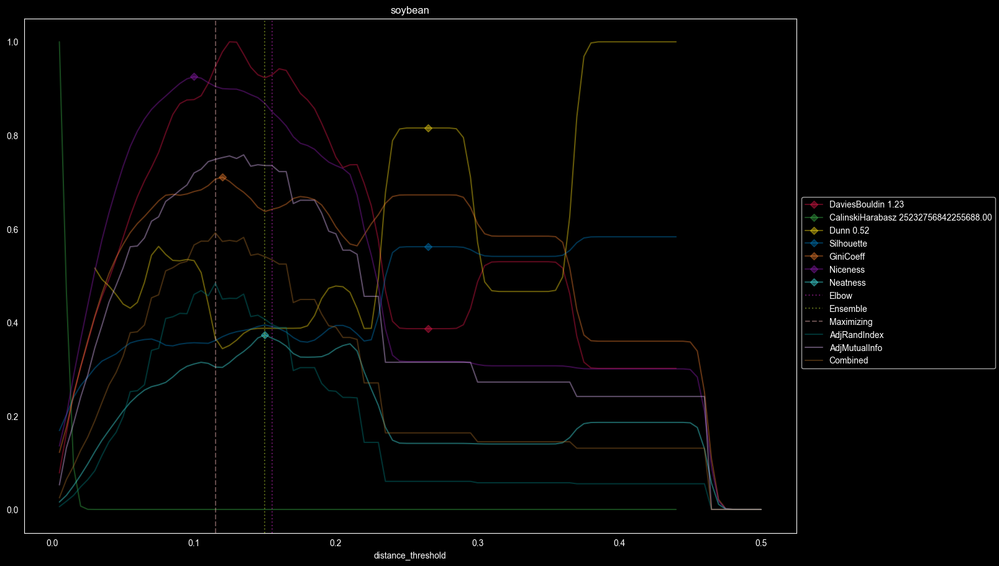

{'Silhouette': 0.3657086058905205, 'Niceness': 0.906976687749207, 'GiniCoeff': 0.7157296940347788, 'Neatness': 0.2973713263426201, 'sample': {'distance_threshold': 0.115, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 8, 2: 5, 3: 3, 4: 2, 5: 1, 6: 3, 7: 1, 8: 1, 9: 2, 11: 1, 14: 1, 15: 1, 16: 1, 20: 5, 24: 2, 31: 1, 40: 1, 59: 1, 68: 1, 182: 1}, 'DaviesBouldin': 1.1726748670213571, 'CalinskiHarabasz': 66.46255207448642, 'Dunn': 0.15098394492909967, 'AdjRandIndex': 0.4838132251747757, 'AdjMutualInfo': 0.7486103588517, 'Combined': 0.5916161685061194}
5     92
12    91
1     91
15    88
6     44
2     44
10    20
17    20
14    20
4     20
7     20
3     20
11    20
16    20
18    20
0     16
9     15
8     14
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.314669      0.060030  0.163698
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn              

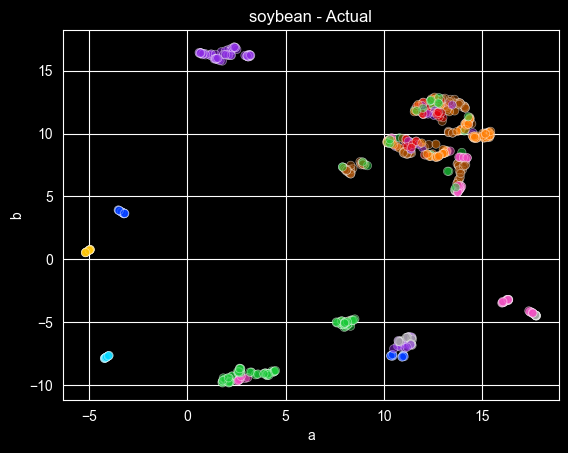

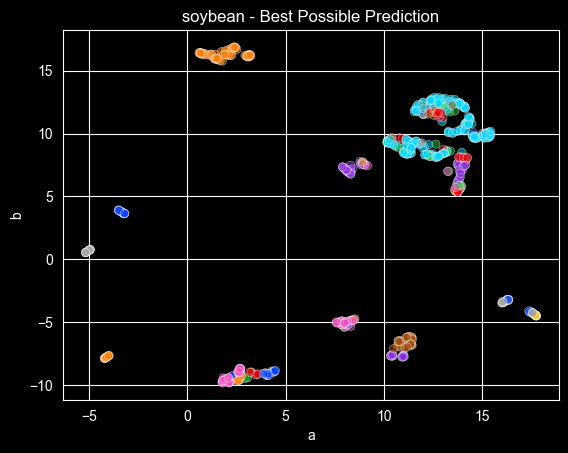

Dataset Summary
n   675.000000
d    35.000000
k    18.000000
e     2.625593
g     0.407115
Name: soybean, dtype: float64


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

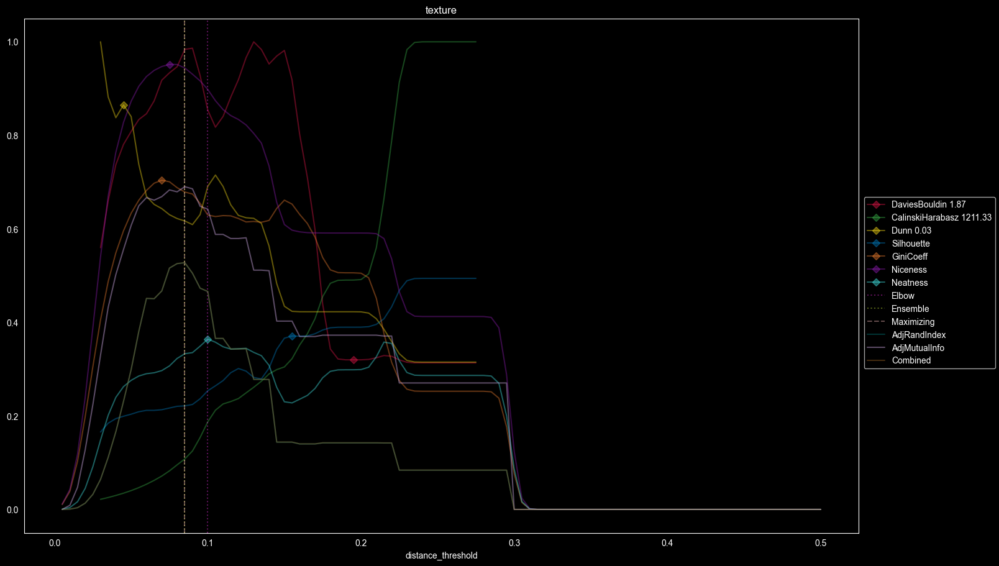

{'Silhouette': 0.21936369048540538, 'Niceness': 0.9486118107570215, 'GiniCoeff': 0.6656891495601173, 'Neatness': 0.3465617895618088, 'sample': {'distance_threshold': 0.085, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 8, 3: 1, 4: 3, 5: 1, 8: 2, 9: 1, 12: 1, 14: 1, 15: 1, 20: 1, 21: 1, 45: 1, 54: 1, 55: 1, 59: 1, 73: 2, 78: 1, 80: 1, 88: 1, 90: 1, 170: 1}, 'DaviesBouldin': 1.9114585456220374, 'CalinskiHarabasz': 132.0595567197362, 'Dunn': 0.021050428763470047, 'AdjRandIndex': 0.5275591361154822, 'AdjMutualInfo': 0.6901521510355041, 'Combined': 0.5277167600362985}
7     91
6     91
2     91
3     91
9     91
14    91
13    91
4     91
10    91
12    91
8     90
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.372655      0.142278  0.142501
CalinskiHarabasz       0.000000      0.000000  0.000000
Dunn                   0.555863      0.230897  0.231212
Silhouett

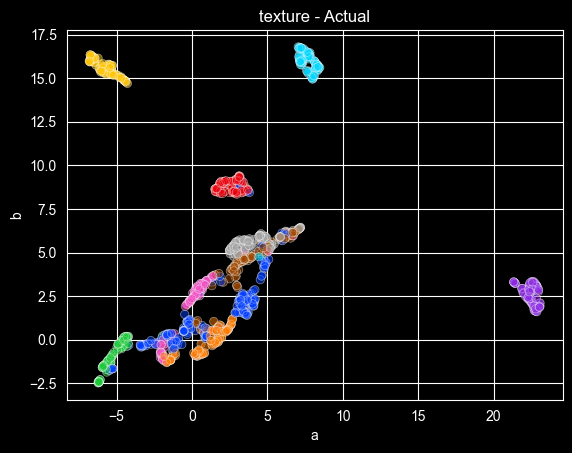

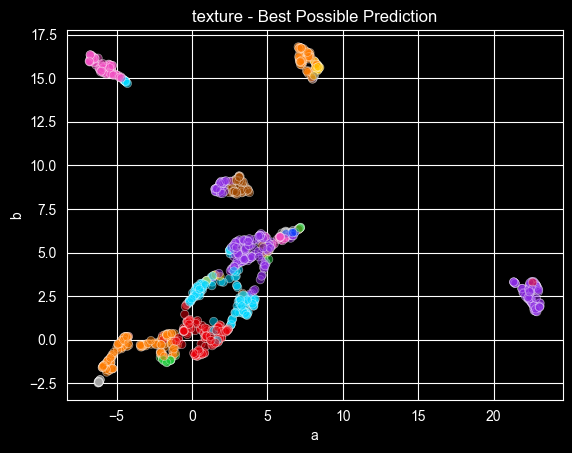

Dataset Summary
n   1000.000000
d     40.000000
k     11.000000
e      2.397890
g      0.000969
Name: texture, dtype: float64


  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/959 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

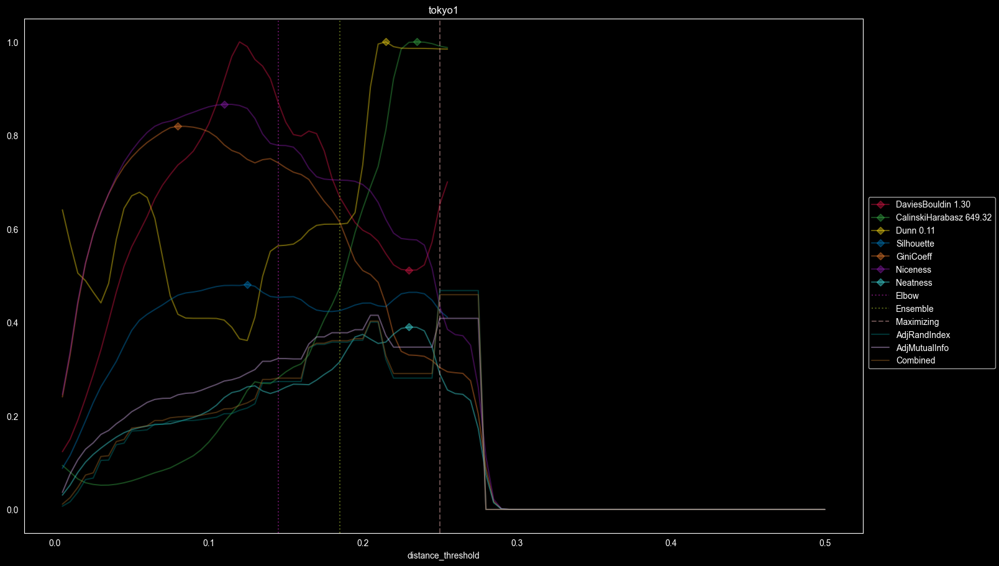

{'Silhouette': 0.4078333297685654, 'Niceness': 0.37313134542006177, 'GiniCoeff': 0.29229525862068967, 'Neatness': 0.2472083968844234, 'sample': {'distance_threshold': 0.25, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {217: 1, 742: 1}, 'DaviesBouldin': 0.92612298077092, 'CalinskiHarabasz': 640.868352064282, 'Dunn': 0.10566655572026093, 'AdjRandIndex': 0.46813161453635177, 'AdjMutualInfo': 0.4086319445671108, 'Combined': 0.4592868090705578}
1    613
0    346
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.347124      0.280858  0.290708
CalinskiHarabasz       0.347124      0.280858  0.290708
Dunn                   0.372190      0.321248  0.328821
Silhouette             0.291149      0.216887  0.227926
GiniCoeff              0.245190      0.189441  0.197728
Niceness               0.274554      0.204618  0.215014
Neatness               0.347124      0.280858  0.29

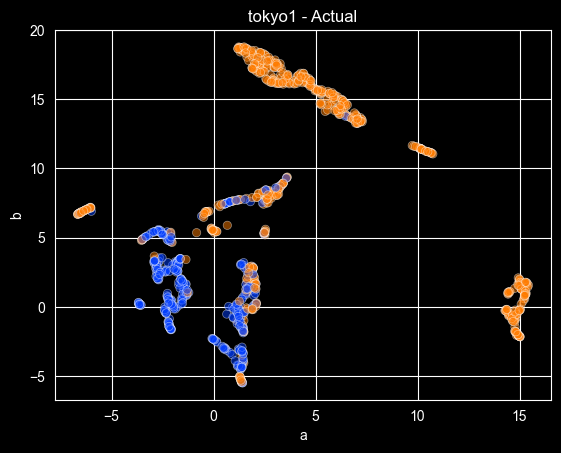

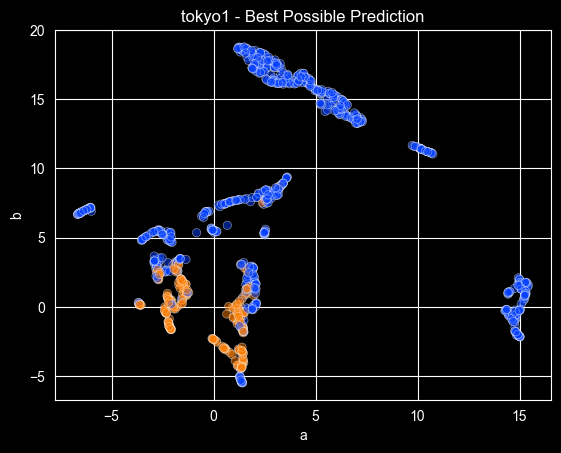

Dataset Summary
n   959.000000
d    44.000000
k     2.000000
e     0.653873
g     0.148653
Name: tokyo1, dtype: float64


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

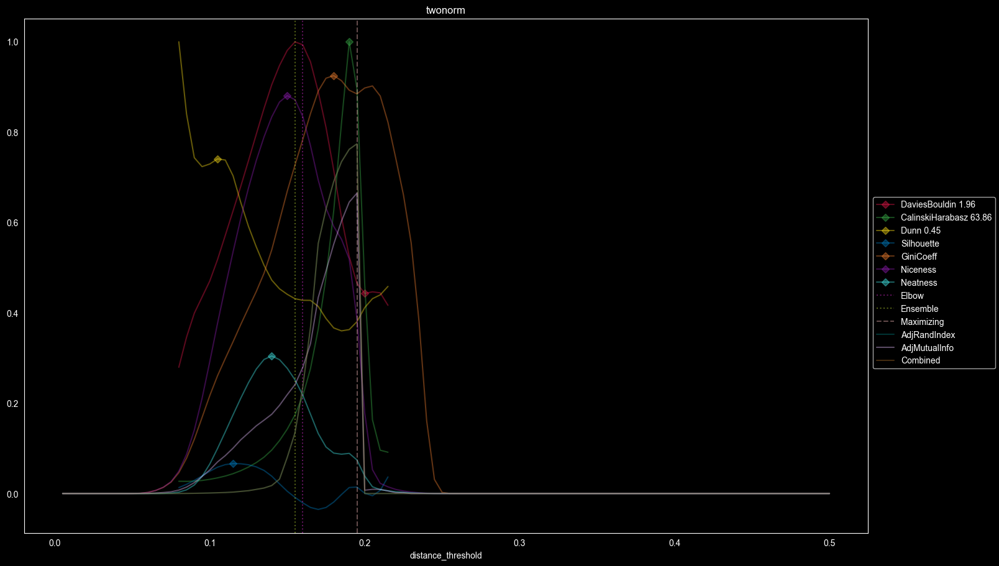

{'Silhouette': 0.03915467306277873, 'Niceness': 0.5390046286738293, 'GiniCoeff': 0.8482004798720342, 'Neatness': 0.11136894423073095, 'sample': {'distance_threshold': 0.195, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 5, 2: 2, 3: 1, 468: 1, 520: 1}, 'DaviesBouldin': 0.8478718495394123, 'CalinskiHarabasz': 90.74778712793122, 'Dunn': 0.15980088006424564, 'AdjRandIndex': 0.7742132165256257, 'AdjMutualInfo': 0.6649521358839119, 'Combined': 0.7742132165256257}
0    500
1    500
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.007369      0.000000  0.000000
CalinskiHarabasz       0.645192      0.761978  0.761978
Dunn                   0.069933      0.001709  0.001709
Silhouette             0.100409      0.003162  0.003162
GiniCoeff              0.552198      0.690816  0.690816
Niceness               0.218921      0.080221  0.080221
Neatness               0.17554

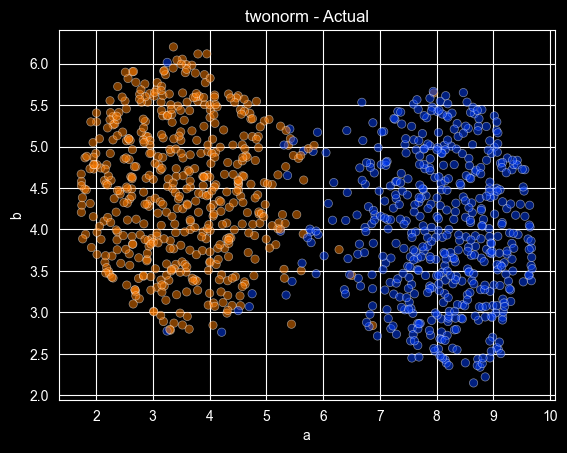

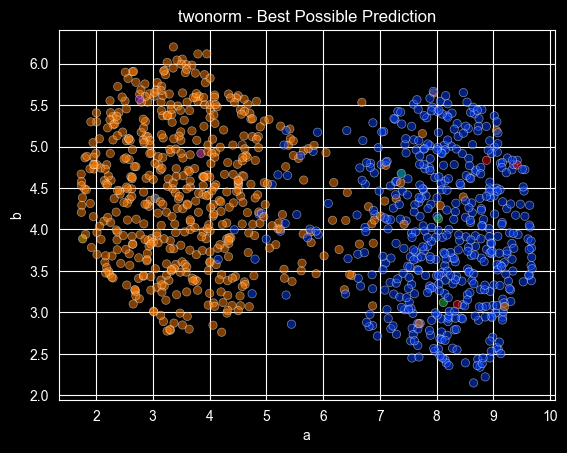

Dataset Summary
n   1000.000000
d     20.000000
k      2.000000
e      0.693147
g      0.000000
Name: twonorm, dtype: float64


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

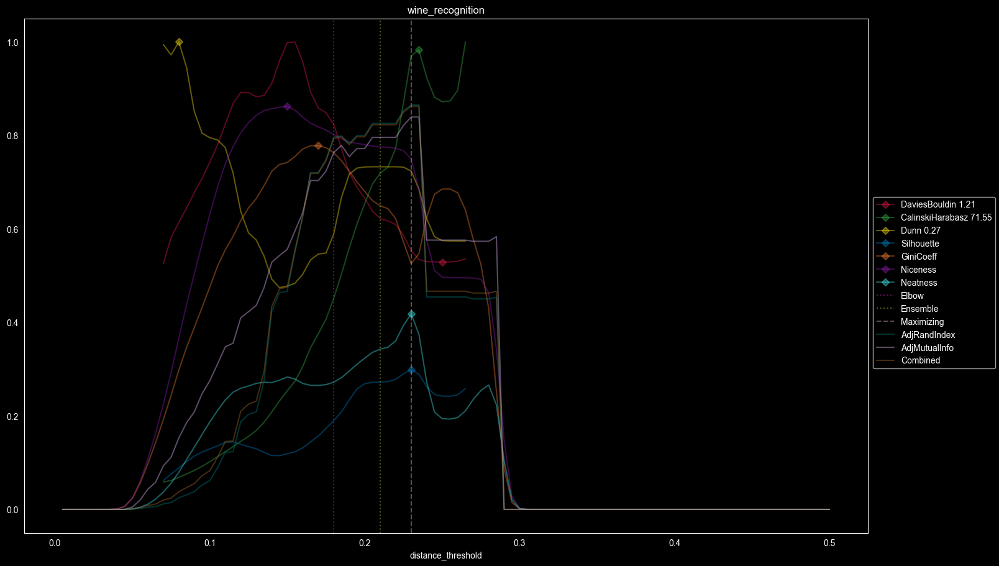

{'Silhouette': 0.3115524014498681, 'Niceness': 0.7639555174228954, 'GiniCoeff': 0.477979797979798, 'Neatness': 0.45874794703543353, 'sample': {'distance_threshold': 0.23, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 53: 1, 61: 1, 62: 1}, 'DaviesBouldin': 0.6412982649790011, 'CalinskiHarabasz': 75.02892880004006, 'Dunn': 0.19967344375092727, 'AdjRandIndex': 0.8651168482162414, 'AdjMutualInfo': 0.8393073258750644, 'Combined': 0.862518515832399}
2    71
1    59
3    48
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
DaviesBouldin          0.575989      0.454403  0.466643
CalinskiHarabasz       0.839307      0.865117  0.862519
Dunn                   0.152837      0.024965  0.037838
Silhouette             0.839307      0.865117  0.862519
GiniCoeff              0.703420      0.720571  0.718845
Niceness               0.556431      0.466575  0.475621
Neatness               0.839307    

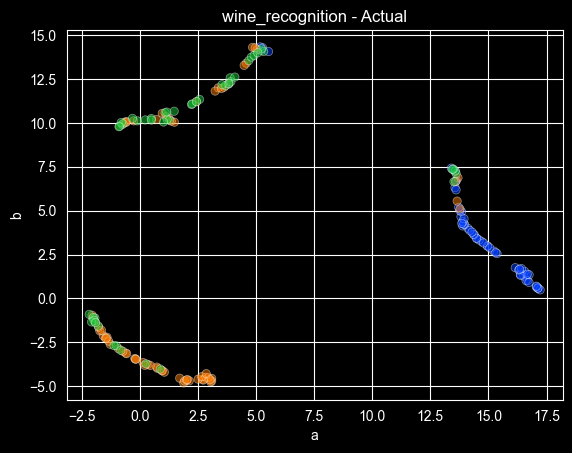

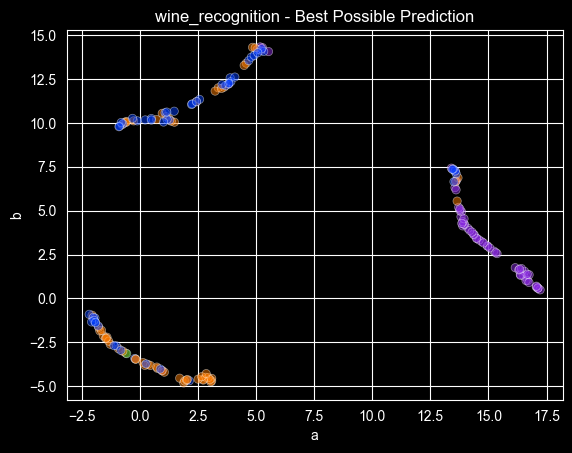

Dataset Summary
n   178.000000
d    13.000000
k     3.000000
e     1.086038
g     0.100673
Name: wine_recognition, dtype: float64


In [2]:
# https://github.com/EpistasisLab/pmlb/issues/167
# deprecated = [
#     "cmc",
#     "195_auto_price",
#     "207_autoPrice",
#     "glass",
#     "heart_c",
#     "cleve",
#     "cleveland_nominal",
#     "heart_statlog",
#     "heart_h",
#     "colic",
#     "vote",
#     "wdbc",
#     "australian",
#     "buggyCrx",
#     "crx",
#     "breast_w",
#     "pima",
#     "german",
#     "flare",
#     "car_evaluation",
#     "kr_vs_kp",
#     "294_satellite_image",
#     "197_cpu_act",
#     "227_cpu_small",
#     "562_cpu_small",
#     "1595_poker",
# ]

classification_dataset_names = [
    "agaricus_lepiota",
    "analcatdata_authorship",
    "breast",
    "breast_cancer_wisconsin",
    "collins",
    "confidence",
    "dermatology",
    "ecoli",
    "house_votes_84",
    "iris",
    "kddcup",
    "mfeat_factors",
    "mfeat_fourier",
    "mfeat_karhunen",
    "mfeat_morphological",
    "mfeat_pixel",
    "new_thyroid",
    "optdigits",
    "pendigits",
    "penguins",
    "ring",
    "satimage",
    "segmentation",
    "soybean",
    "texture",
    "tokyo1",
    'twonorm',
    "wine_recognition",
]

max_size = 1000

max_muti = 0
max_rand = 0
max_combo = 0
results = 0
ranks = 0
d = {}
r = {}

for classification_dataset in classification_dataset_names:
    X, y = fetch_data(
        classification_dataset, return_X_y=True, local_cache_dir="/Users/temp/pmlb_data"
    )
    if len(X) > max_size:
        _, X, _, y = train_test_split(X, y, test_size=max_size, random_state=42, stratify=y)
    X = pd.DataFrame(X)
    y = pd.Series(y)
    if X.shape[1] > 2:
        vis = pd.DataFrame(
            umap.UMAP(random_state=42).fit_transform(X), columns=list("ab"), index=X.index
        )
    elif X.shape[1] == 2:
        vis = X.copy()
        vis.columns = list("ab")
    else:
        vis = X.copy()
        vis.columns = ["a"]
        vis["b"] = 0.0
    kwargs = dict(
        df=X,
        title=f"{classification_dataset}",
        actual=y,
    )
    if "precomputed" in inspect.getfullargspec(optimize).args:
        kwargs["precomputed"] = True
        kwargs["chunksize"] = 20
    clusters, (score, res) = optimize(**kwargs)
    print(res)
    plt.title(f"{classification_dataset} - Actual")
    scatterplot(vis, x="a", y="b", hue=y, alpha=0.5, palette="bright", legend=False)
    plt.show()
    plt.title(f"{classification_dataset} - Best Possible Prediction")
    scatterplot(vis, x="a", y="b", hue=clusters, alpha=0.5, palette="bright", legend=False)
    plt.show()
    rank = res.rank(ascending=False)
    max_muti += res.max_muti
    max_rand += res.max_rand
    max_combo += res.max_combo
    results += res
    ranks += rank
    res = res.Combined
    res["n"], res["d"] = X.shape
    res["k"] = len(np.unique(y))
    counts = np.unique(y, return_counts=True)[1]
    res["e"] = entropy(counts)
    res["g"] = gini_coefficient(counts)
    res.name = classification_dataset
    d[classification_dataset] = res
    res.index.name = "Dataset Summary"
    print(res[["n", "d", "k", "e", "g"]])
    res.index.name = "Metric"
    rank = rank.Combined
    rank["n"], rank["d"], rank["k"], rank["e"], rank["g"] = res[["n", "d", "k", "e", "g"]]
    r[classification_dataset] = rank

denom = len(classification_dataset_names)

max_muti /= denom
max_rand /= denom
max_combo /= denom
results /= denom
ranks /= denom
df = pd.DataFrame(d).T
df_rank = pd.DataFrame(r).T

# Results

In [3]:
print("Average Mutual Information:", max_muti)
print("Average Rand Index:", max_rand)
print("Average Combined:", max_combo)

Average Mutual Information: 0.6789160056778222
Average Rand Index: 0.6487558425187193
Average Combined: 0.6486934582030299


### Results across all datasets
- Averages per metric broken down by Mutual Information, Rand Index, and Combined
- Summary statistics
- Correlation matrix
- Mann-Whitney U test

### Raw Scores

In [4]:
results

,AdjMutualInfo,AdjRandIndex,Combined
Metric,,,
DaviesBouldin,0.524667,0.445447,0.451440
CalinskiHarabasz,0.352385,0.315322,0.311832
Dunn,0.428674,0.326497,0.332559
Silhouette,0.554753,0.455913,0.458923
GiniCoeff,0.527395,0.448780,0.451519
Niceness,0.546328,0.422830,0.438113
Neatness,0.578650,0.467660,0.478858
Elbow,0.588549,0.501211,0.507223
Ensemble,0.619397,0.548262,0.551910


In [5]:
df.describe()

Metric,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,0.451440,0.311832,0.332559,0.458923,0.451519,0.438113,0.478858,0.507223,0.551910,725.142857,42.178571,6.535714,1.543618,0.144173
std,0.275520,0.323347,0.267880,0.275697,0.218360,0.190228,0.240310,0.186092,0.193501,336.290518,56.517486,4.307462,0.715935,0.195110
min,0.000000,0.000000,0.001709,0.002910,0.002895,0.080221,0.017765,0.204435,0.134550,72.000000,3.000000,2.000000,0.644154,0.000000
25%,0.271197,0.000000,0.083304,0.200641,0.363892,0.337498,0.301608,0.416485,0.442528,417.750000,12.250000,2.750000,0.789399,0.000000
50%,0.512034,0.196437,0.293742,0.511361,0.515842,0.456042,0.502971,0.520032,0.563197,979.500000,22.500000,6.000000,1.545430,0.061001
75%,0.664662,0.604682,0.514140,0.681713,0.566089,0.576823,0.635531,0.609292,0.665376,1000.000000,41.750000,10.000000,2.302585,0.226015
max,0.963614,0.909557,0.927707,0.909557,0.786595,0.855251,0.909557,0.938511,0.927707,1000.000000,240.000000,18.000000,2.625593,0.831584


In [6]:
df.corr()

Metric,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
Metric,,,,,,,,,,,,,,
DaviesBouldin,1.000000,0.335927,0.334805,0.881135,0.489009,0.250516,0.632690,0.644174,0.748591,-0.390356,0.115007,-0.200598,-0.248573,0.473915
CalinskiHarabasz,0.335927,1.000000,0.249614,0.396280,0.492376,-0.050916,0.114256,0.273163,0.392957,-0.119374,-0.181028,-0.403622,-0.532547,0.306195
Dunn,0.334805,0.249614,1.000000,0.119221,0.095774,0.180539,0.286645,0.285576,0.381335,-0.029968,-0.177450,-0.124410,-0.225488,0.458166
Silhouette,0.881135,0.396280,0.119221,1.000000,0.494749,0.312853,0.640455,0.685151,0.779688,-0.305209,0.192374,-0.144584,-0.157489,0.432761
GiniCoeff,0.489009,0.492376,0.095774,0.494749,1.000000,0.228833,0.302917,0.540368,0.521215,-0.401765,-0.297112,-0.055093,-0.181724,0.500896
Niceness,0.250516,-0.050916,0.180539,0.312853,0.228833,1.000000,0.592014,0.690019,0.600730,0.108736,0.270550,0.590715,0.526905,0.265341
Neatness,0.632690,0.114256,0.286645,0.640455,0.302917,0.592014,1.000000,0.740850,0.744613,-0.295810,0.236288,0.139951,0.077535,0.379044
Elbow,0.644174,0.273163,0.285576,0.685151,0.540368,0.690019,0.740850,1.000000,0.855110,-0.191480,0.171249,0.217382,0.215686,0.322547
Ensemble,0.748591,0.392957,0.381335,0.779688,0.521215,0.600730,0.744613,0.855110,1.000000,-0.271736,0.177605,0.101570,0.027470,0.487106


In [7]:
columns = df.columns[:-5]
pd.DataFrame([[mannwhitneyu(df[x], df[y]).pvalue for x in columns]
              for y in columns], index=columns, columns=columns)

Metric,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble
Metric,,,,,,,,,
DaviesBouldin,1.000000,0.074565,0.096243,0.724569,0.915170,0.652245,0.856943,0.658157,0.275810
CalinskiHarabasz,0.074565,1.000000,0.416595,0.043523,0.055900,0.053827,0.020660,0.012329,0.005274
Dunn,0.096243,0.416595,1.000000,0.062890,0.054173,0.053152,0.028101,0.004467,0.000988
Silhouette,0.724569,0.043523,0.062890,1.000000,0.700170,0.549760,0.902172,0.670060,0.389586
GiniCoeff,0.915170,0.055900,0.054173,0.700170,1.000000,0.486153,0.724601,0.496456,0.106505
Niceness,0.652245,0.053827,0.053152,0.549760,0.486153,1.000000,0.544300,0.201181,0.023229
Neatness,0.856943,0.020660,0.028101,0.902172,0.724601,0.544300,1.000000,0.793172,0.222123
Elbow,0.658157,0.012329,0.004467,0.670060,0.496456,0.201181,0.793172,1.000000,0.358771
Ensemble,0.275810,0.005274,0.000988,0.389586,0.106505,0.023229,0.222123,0.358771,1.000000


### Ranks

In [8]:
ranks

,AdjMutualInfo,AdjRandIndex,Combined
Metric,,,
DaviesBouldin,5.000000,5.071429,5.071429
CalinskiHarabasz,6.410714,6.267857,6.267857
Dunn,6.196429,6.053571,6.053571
Silhouette,4.500000,4.571429,4.535714
GiniCoeff,5.750000,5.535714,5.571429
Niceness,5.232143,5.125000,5.160714
Neatness,4.339286,4.767857,4.767857
Elbow,4.196429,4.160714,4.125000
Ensemble,3.375000,3.446429,3.446429


In [9]:
df_rank.describe()

Metric,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,5.071429,6.267857,6.053571,4.535714,5.571429,5.160714,4.767857,4.125000,3.446429,725.142857,42.178571,6.535714,1.543618,0.144173
std,2.791237,2.823454,2.709173,2.508979,2.141799,2.556957,2.470126,2.053114,1.685116,336.290518,56.517486,4.307462,0.715935,0.195110
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,72.000000,3.000000,2.000000,0.644154,0.000000
25%,2.375000,4.000000,4.500000,2.500000,4.000000,2.000000,2.500000,2.750000,2.000000,417.750000,12.250000,2.750000,0.789399,0.000000
50%,5.250000,7.500000,6.500000,4.000000,5.750000,6.000000,4.750000,4.250000,3.750000,979.500000,22.500000,6.000000,1.545430,0.061001
75%,8.000000,9.000000,8.000000,7.000000,7.000000,7.000000,7.000000,5.125000,4.625000,1000.000000,41.750000,10.000000,2.302585,0.226015
max,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,8.500000,9.000000,7.000000,1000.000000,240.000000,18.000000,2.625593,0.831584


In [10]:
df_rank.corr()

Metric,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
Metric,,,,,,,,,,,,,,
DaviesBouldin,1.000000,-0.156429,0.034984,0.364537,-0.313747,-0.681478,0.064270,-0.313450,-0.272787,0.249535,-0.052439,0.263161,0.297728,-0.284196
CalinskiHarabasz,-0.156429,1.000000,-0.194412,-0.107273,-0.009406,-0.278083,-0.248314,-0.172107,0.063457,0.126028,0.258943,0.542014,0.644928,-0.052157
Dunn,0.034984,-0.194412,1.000000,-0.402143,-0.220895,-0.142973,0.062807,-0.314205,0.047300,-0.279107,0.116526,0.108532,0.207176,-0.167587
Silhouette,0.364537,-0.107273,-0.402143,1.000000,-0.176245,-0.386288,0.141826,-0.119533,-0.518567,0.100647,-0.220360,0.171229,0.060532,0.013330
GiniCoeff,-0.313747,-0.009406,-0.220895,-0.176245,1.000000,0.134775,-0.453542,0.113705,0.203772,0.158440,0.386021,-0.162876,-0.108428,-0.102464
Niceness,-0.681478,-0.278083,-0.142973,-0.386288,0.134775,1.000000,-0.024660,0.394642,0.266391,-0.252130,-0.068763,-0.631892,-0.662034,0.249332
Neatness,0.064270,-0.248314,0.062807,0.141826,-0.453542,-0.024660,1.000000,-0.337309,-0.443544,0.203110,-0.185268,-0.107971,-0.101396,-0.001130
Elbow,-0.313450,-0.172107,-0.314205,-0.119533,0.113705,0.394642,-0.337309,1.000000,0.023418,-0.249732,-0.182134,-0.204686,-0.456962,0.555822
Ensemble,-0.272787,0.063457,0.047300,-0.518567,0.203772,0.266391,-0.443544,0.023418,1.000000,-0.137889,-0.099062,-0.200001,-0.149202,-0.115926


In [11]:
pd.DataFrame([[mannwhitneyu(df_rank[x], df_rank[y]).pvalue for x in columns]
              for y in columns], index=columns, columns=columns)


Metric,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble
Metric,,,,,,,,,
DaviesBouldin,1.000000,0.081405,0.206504,0.504299,0.558737,0.993406,0.693062,0.220133,0.038708
CalinskiHarabasz,0.081405,1.000000,0.642049,0.019177,0.161164,0.087309,0.023662,0.004482,0.000243
Dunn,0.206504,0.642049,1.000000,0.040175,0.272573,0.180303,0.055287,0.004379,0.000292
Silhouette,0.504299,0.019177,0.040175,1.000000,0.111638,0.457425,0.710896,0.615455,0.140366
GiniCoeff,0.558737,0.161164,0.272573,0.111638,1.000000,0.620412,0.220205,0.013200,0.000309
Niceness,0.993406,0.087309,0.180303,0.457425,0.620412,1.000000,0.581284,0.109371,0.010787
Neatness,0.693062,0.023662,0.055287,0.710896,0.220205,0.581284,1.000000,0.348501,0.046459
Elbow,0.220133,0.004482,0.004379,0.615455,0.013200,0.109371,0.348501,1.000000,0.228573
Ensemble,0.038708,0.000243,0.000292,0.140366,0.000309,0.010787,0.046459,0.228573,1.000000
